In [1]:
# =============================================================================
# EXPLORATORY DATA ANALYSIS
# IoT-Based Intelligent Building Decision Support System
# =============================================================================

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

# Plot Settings
plt.style.use("ggplot")
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["font.size"] = 11

pd.set_option("display.max_columns", None)

print("="*80)
print("LIBRARIES IMPORTED SUCCESSFULLY")
print("="*80)

LIBRARIES IMPORTED SUCCESSFULLY


In [2]:
# =============================================================================
# LOAD CLEANED INTEGRATED DATASET
# =============================================================================

dataset_path = r"C:\Users\User\OneDrive\Documents\IoT-Based-Intelligent-Building-DSS\data\processed\integrated_building_dataset.csv"

df = pd.read_csv(dataset_path)

df["datetime"] = pd.to_datetime(df["datetime"])

print("="*80)
print("DATASET LOADED SUCCESSFULLY")
print("="*80)

print("Shape :", df.shape)

df.head()

DATASET LOADED SUCCESSFULLY
Shape : (2310238, 19)


,datetime,timestamp,Academic,Boys_main,Boys_backup,Facilities,Girls_main,Girls_backup,Lecture,Library,Mess,date,year,month,day,hour,ALLSKY_SFC_SW_DWN,WS2M,PRECTOTCORR
0,2013-08-10 00:00:00,1.376093e+09,17227.32129,23973.90039,10066.92920,3390.47437,8789.85889,5821.98145,0.0,3999.33362,20197.85156,2013-08-10,2013,8,10,0,217.51,1.11,5.21
1,2013-08-10 00:01:00,1.376093e+09,18156.65039,23994.48926,10046.74658,3390.47437,8778.48730,5825.85034,0.0,4000.25623,20197.85156,2013-08-10,2013,8,10,0,217.51,1.11,5.21
2,2013-08-10 00:02:00,1.376093e+09,17382.51270,23967.58105,10043.68994,3390.47437,8769.97266,5832.62329,0.0,4001.21399,20197.85156,2013-08-10,2013,8,10,0,217.51,1.11,5.21
3,2013-08-10 00:03:00,1.376093e+09,16858.11426,23952.09766,10021.31787,3390.47437,8763.68848,5814.86597,0.0,3997.19922,20197.85156,2013-08-10,2013,8,10,0,217.51,1.11,5.21
4,2013-08-10 00:04:00,1.376093e+09,15814.67725,23906.31152,10059.65283,3390.47437,8757.82959,5821.58008,0.0,3995.40613,20197.85156,2013-08-10,2013,8,10,0,217.51,1.11,5.21


In [3]:
# =============================================================================
# BUILDING ENERGY FEATURES
# =============================================================================

building_cols = [
    "Academic",
    "Boys_main",
    "Boys_backup",
    "Facilities",
    "Girls_main",
    "Girls_backup",
    "Lecture",
    "Library",
    "Mess"
]

weather_cols = [
    "ALLSKY_SFC_SW_DWN",
    "WS2M",
    "PRECTOTCORR"
]

print("="*80)
print("FEATURES IDENTIFIED")
print("="*80)

print("Building Features :", len(building_cols))
print("Weather Features  :", len(weather_cols))

FEATURES IDENTIFIED
Building Features : 9
Weather Features  : 3


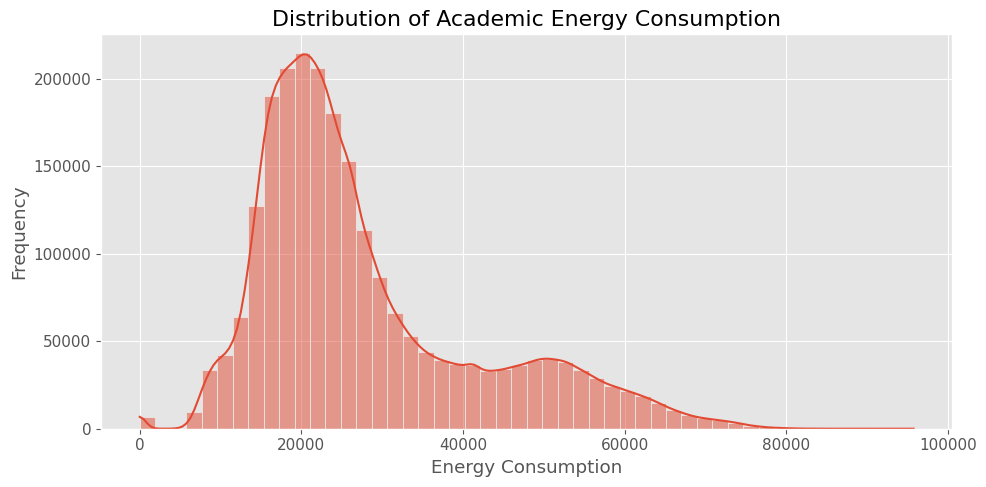

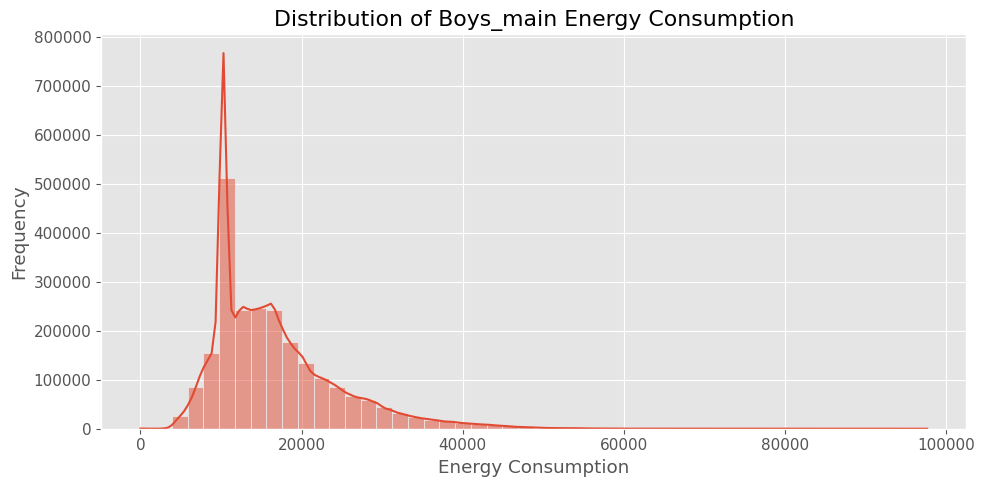

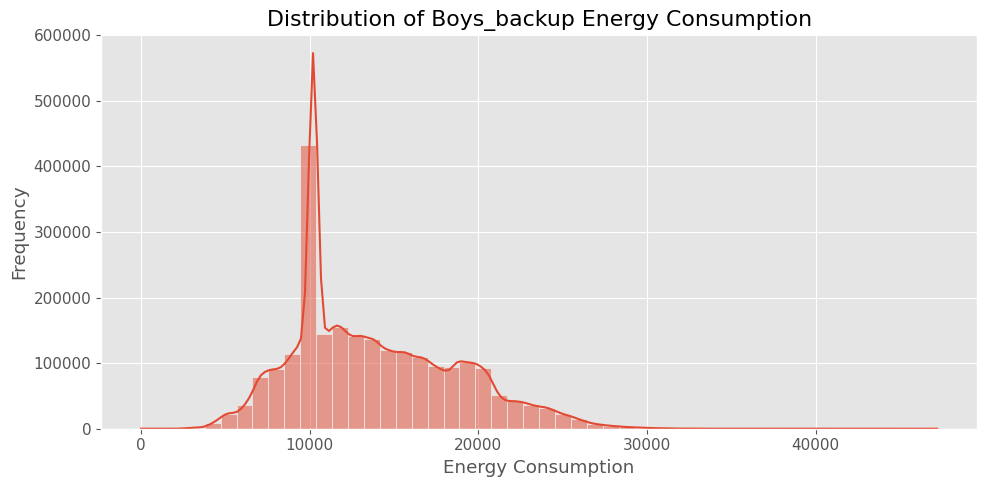

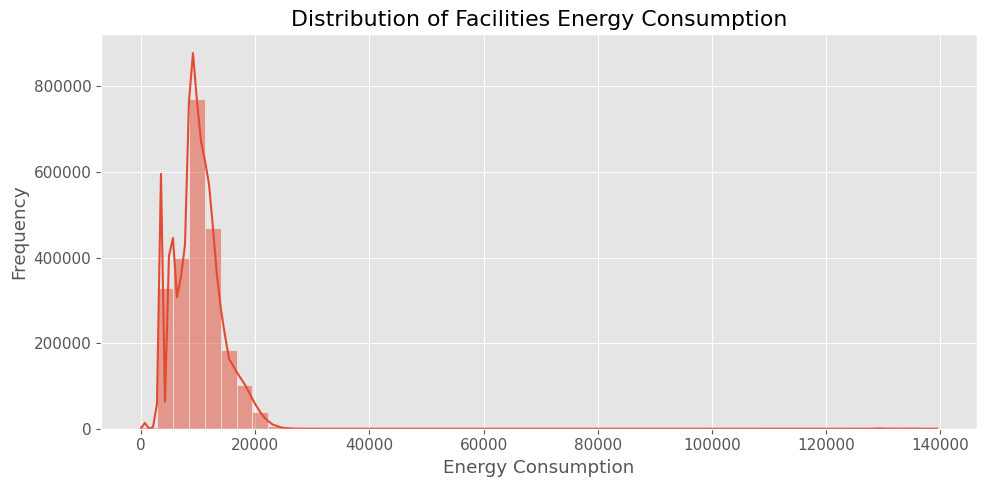

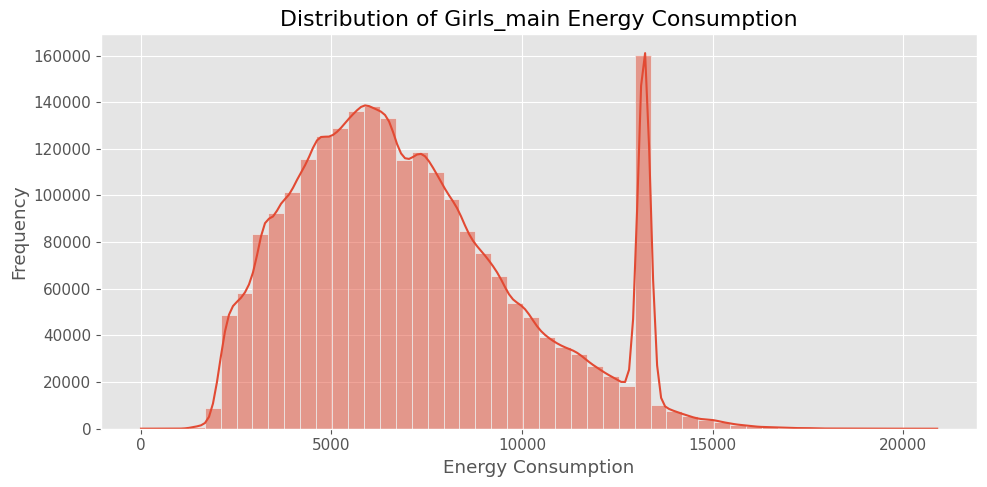

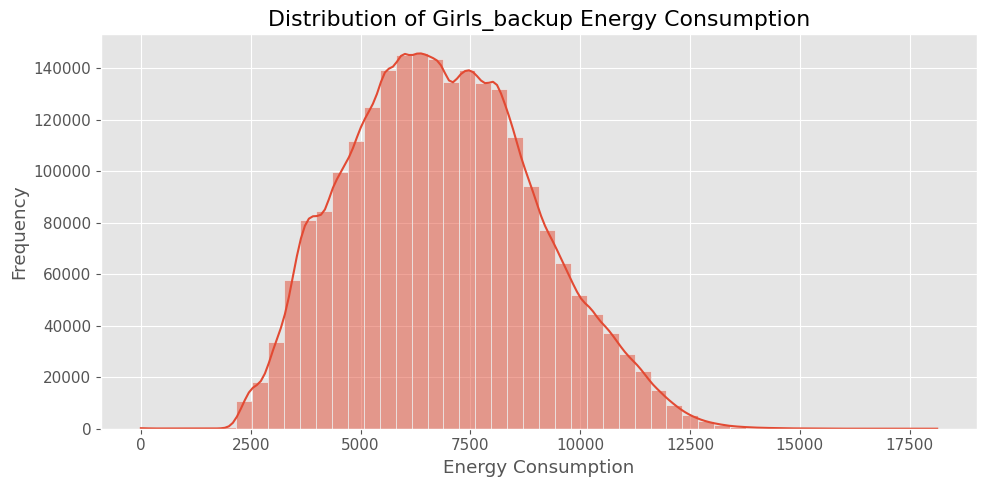

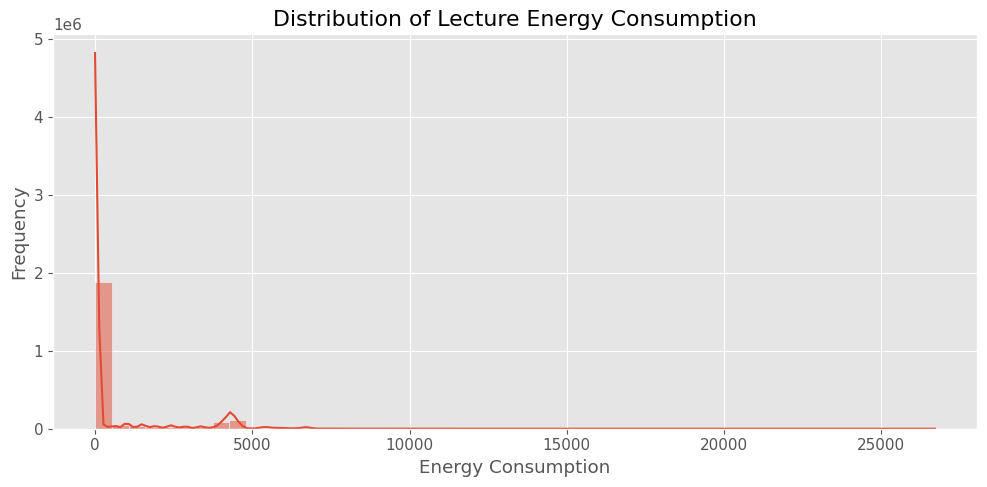

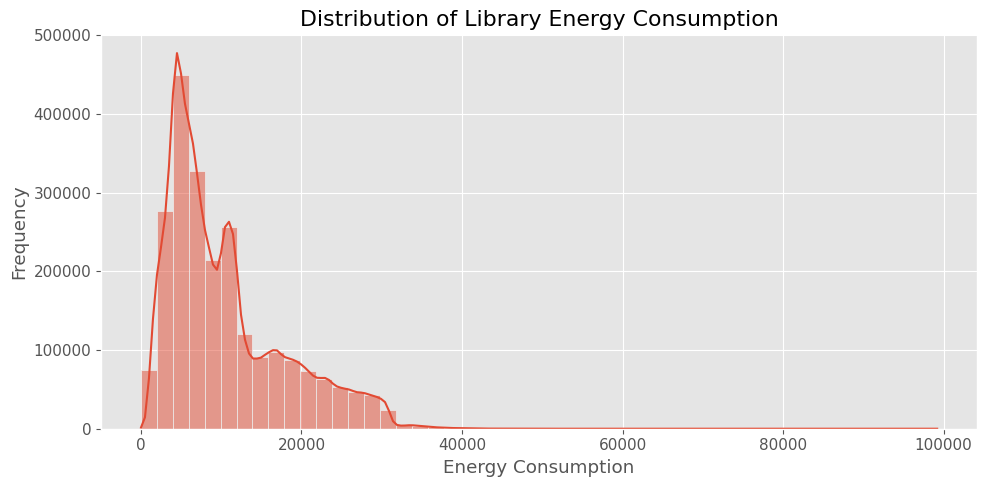

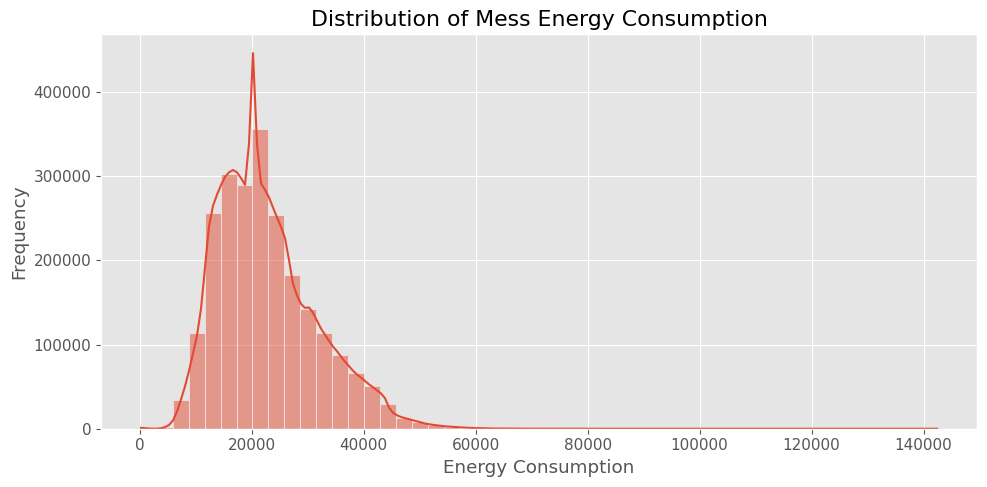

In [4]:
# =============================================================================
# ENERGY CONSUMPTION DISTRIBUTION
# =============================================================================

for col in building_cols:

    plt.figure(figsize=(10,5))

    sns.histplot(
        df[col],
        bins=50,
        kde=True
    )

    plt.title(f"Distribution of {col} Energy Consumption")

    plt.xlabel("Energy Consumption")

    plt.ylabel("Frequency")

    plt.tight_layout()

    plt.show()

In [5]:
# =============================================================================
# ENERGY CONSUMPTION SUMMARY
# =============================================================================

energy_summary = df[building_cols].describe().T

energy_summary

,count,mean,std,min,25%,50%,75%,max
Academic,2310238.0,27908.498390,13987.727679,0.00000,18217.037833,23524.062600,33642.739922,95786.33000
Boys_main,2310238.0,16549.441654,7769.255128,0.00000,10285.183529,14743.525000,20116.737500,97663.86000
Boys_backup,2310238.0,13782.783972,4863.195020,0.00000,10209.030404,12733.480725,17202.480230,47212.14000
Facilities,2310238.0,10102.554558,4770.776790,0.00000,7542.290010,9749.110500,12247.449112,139437.08594
Girls_main,2310238.0,7144.402471,3054.171906,0.00000,4818.491815,6624.098440,8958.506500,20895.92000
Girls_backup,2310238.0,6876.883276,2119.215558,0.00000,5305.559753,6777.543580,8317.851750,18126.82000
Lecture,2310238.0,643.743063,1547.983644,0.00000,0.000000,0.000000,0.000000,26703.07000
Library,2310238.0,10486.172762,7353.425613,0.00000,4878.107697,8160.347000,14206.097500,99208.94531
Mess,2310238.0,22637.285688,8828.987854,232.45924,16070.780558,20994.426270,27597.297500,142442.05469


CORRELATION MATRIX
                   Academic  Boys_main  Boys_backup  Facilities  Girls_main  \
Academic           1.000000   0.014318     0.195124    0.445294    0.135198   
Boys_main          0.014318   1.000000     0.629470    0.004932    0.527660   
Boys_backup        0.195124   0.629470     1.000000    0.275645    0.541292   
Facilities         0.445294   0.004932     0.275645    1.000000    0.179241   
Girls_main         0.135198   0.527660     0.541292    0.179241    1.000000   
Girls_backup       0.122285   0.520442     0.751996    0.254731    0.506611   
Lecture            0.690033  -0.030795     0.106227    0.166801    0.024684   
Library            0.515819  -0.026462     0.196592    0.315496    0.255114   
Mess               0.447153   0.190622     0.331118    0.388163    0.227356   
ALLSKY_SFC_SW_DWN  0.170174   0.003857     0.179209    0.277154    0.186711   
WS2M               0.021245  -0.076691    -0.054038    0.108160    0.049531   
PRECTOTCORR        0.052547   0.0

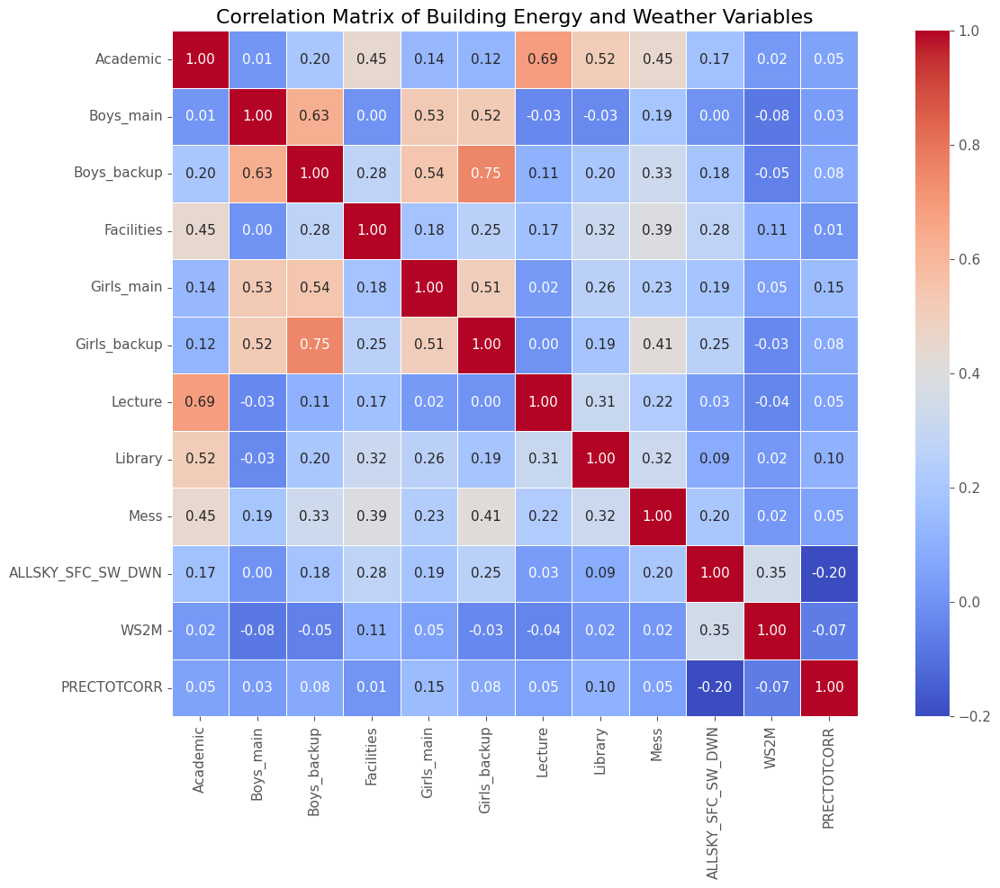

In [12]:
# =============================================================================
# CORRELATION MATRIX
# =============================================================================

correlation_df = df[building_cols + weather_cols]

correlation_matrix = correlation_df.corr(method="pearson")

print("="*80)
print("CORRELATION MATRIX")
print("="*80)

print(correlation_matrix)
# =============================================================================
# CORRELATION HEATMAP
# =============================================================================

plt.figure(figsize=(14,10))

sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    square=True
)

plt.title("Correlation Matrix of Building Energy and Weather Variables")

plt.tight_layout()

plt.show()

In [8]:
# =============================================================================
# STRONGEST CORRELATIONS
# =============================================================================

corr_pairs = (
    correlation_matrix
    .where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
    .stack()
    .reset_index()
)

corr_pairs.columns = ["Feature 1", "Feature 2", "Correlation"]

corr_pairs = corr_pairs.reindex(
    corr_pairs["Correlation"].abs().sort_values(ascending=False).index
)

corr_pairs.head(20)

,Feature 1,Feature 2,Correlation
23,Boys_backup,Girls_backup,0.751996
5,Academic,Lecture,0.690033
11,Boys_main,Boys_backup,0.629470
22,Boys_backup,Girls_main,0.541292
13,Boys_main,Girls_main,0.527660
14,Boys_main,Girls_backup,0.520442
6,Academic,Library,0.515819
38,Girls_main,Girls_backup,0.506611
7,Academic,Mess,0.447153
2,Academic,Facilities,0.445294


                   Academic  Boys_main  Boys_backup  Facilities  Girls_main  \
ALLSKY_SFC_SW_DWN  0.170174   0.003857     0.179209    0.277154    0.186711   
WS2M               0.021245  -0.076691    -0.054038    0.108160    0.049531   
PRECTOTCORR        0.052547   0.028991     0.077028    0.008913    0.146947   

                   Girls_backup   Lecture   Library      Mess  
ALLSKY_SFC_SW_DWN      0.252973  0.031801  0.087248  0.198830  
WS2M                  -0.030437 -0.039814  0.017325  0.017858  
PRECTOTCORR            0.078611  0.048032  0.104556  0.048815  


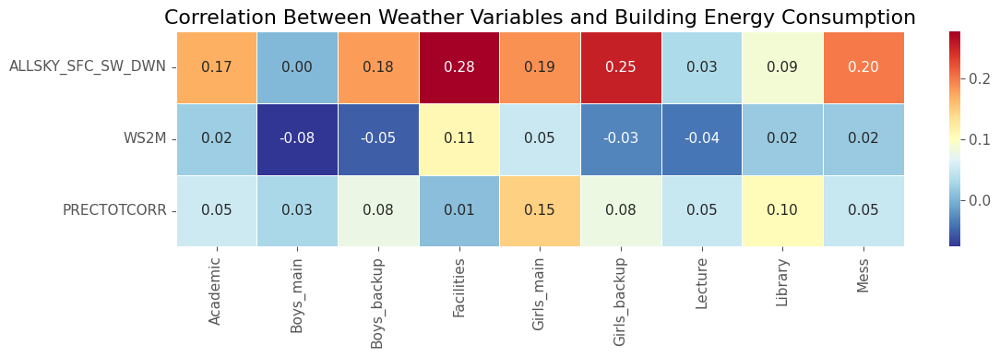

In [11]:
# =============================================================================
# WEATHER VS BUILDING CORRELATIONS
# =============================================================================

weather_building_corr = correlation_matrix.loc[
    weather_cols,
    building_cols
]

print(weather_building_corr)
# =============================================================================
# WEATHER AND BUILDING CORRELATION HEATMAP
# =============================================================================

plt.figure(figsize=(12,4))

sns.heatmap(
    weather_building_corr,
    annot=True,
    cmap="RdYlBu_r",
    fmt=".2f",
    linewidths=0.5
)

plt.title("Correlation Between Weather Variables and Building Energy Consumption")

plt.tight_layout()

plt.show()

In [13]:
# =============================================================================
# HOURLY ENERGY CONSUMPTION ANALYSIS
# =============================================================================

hourly_energy = (
    df.groupby("hour")[building_cols]
      .mean()
      .reset_index()
)

print("="*80)
print("AVERAGE HOURLY ENERGY CONSUMPTION")
print("="*80)

hourly_energy.head()

AVERAGE HOURLY ENERGY CONSUMPTION


,hour,Academic,Boys_main,Boys_backup,Facilities,Girls_main,Girls_backup,Lecture,Library,Mess
0,0,19294.858661,14314.300986,13438.965159,9012.420925,6476.795274,6762.400068,303.523606,8463.263695,18549.896436
1,1,18052.159457,12615.426789,12663.230310,9123.279231,5755.201066,5842.522126,427.832573,7557.247810,18355.420657
2,2,23262.802859,12643.745294,12490.680153,9595.791277,5890.618406,5782.591935,844.554888,7725.554872,18784.962372
3,3,31340.417323,13332.721387,12490.659860,10964.450666,6241.953832,5794.841673,1377.037023,10790.613088,21974.281641
4,4,37013.679134,13135.876018,12261.140685,11419.993648,6279.482884,5746.023866,1650.095582,12209.610470,23908.108824


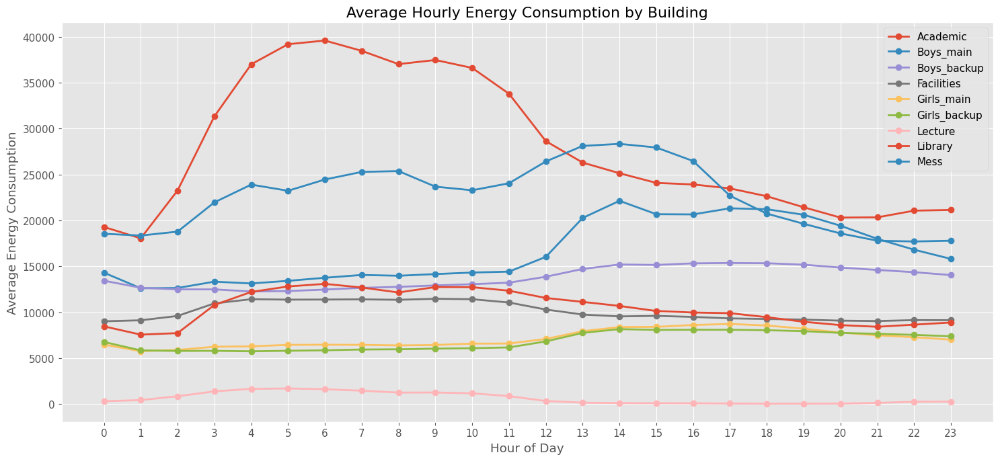

In [14]:
# =============================================================================
# HOURLY ENERGY CONSUMPTION PATTERN
# =============================================================================

plt.figure(figsize=(15,7))

for col in building_cols:
    plt.plot(
        hourly_energy["hour"],
        hourly_energy[col],
        marker="o",
        linewidth=2,
        label=col
    )

plt.title("Average Hourly Energy Consumption by Building")

plt.xlabel("Hour of Day")

plt.ylabel("Average Energy Consumption")

plt.xticks(range(24))

plt.grid(True)

plt.legend()

plt.tight_layout()

plt.show()

In [15]:
# =============================================================================
# PEAK ENERGY HOUR
# =============================================================================

peak_hours = pd.DataFrame(columns=["Building", "Peak Hour", "Average Consumption"])

for col in building_cols:

    idx = hourly_energy[col].idxmax()

    peak_hours.loc[len(peak_hours)] = [
        col,
        hourly_energy.loc[idx, "hour"],
        hourly_energy.loc[idx, col]
    ]

peak_hours

,Building,Peak Hour,Average Consumption
0,Academic,6,39603.464464
1,Boys_main,14,22138.807230
2,Boys_backup,17,15368.984553
3,Facilities,9,11465.267512
4,Girls_main,17,8725.049938
5,Girls_backup,14,8161.560901
6,Lecture,5,1693.594131
7,Library,6,13091.092289
8,Mess,14,28346.779528


In [16]:
# =============================================================================
# LOWEST ENERGY HOUR
# =============================================================================

lowest_hours = pd.DataFrame(columns=["Building", "Lowest Hour", "Average Consumption"])

for col in building_cols:

    idx = hourly_energy[col].idxmin()

    lowest_hours.loc[len(lowest_hours)] = [
        col,
        hourly_energy.loc[idx, "hour"],
        hourly_energy.loc[idx, col]
    ]

lowest_hours

,Building,Lowest Hour,Average Consumption
0,Academic,1,18052.159457
1,Boys_main,1,12615.426789
2,Boys_backup,4,12261.140685
3,Facilities,0,9012.420925
4,Girls_main,1,5755.201066
5,Girls_backup,4,5746.023866
6,Lecture,19,35.516084
7,Library,1,7557.247810
8,Mess,22,17709.710854


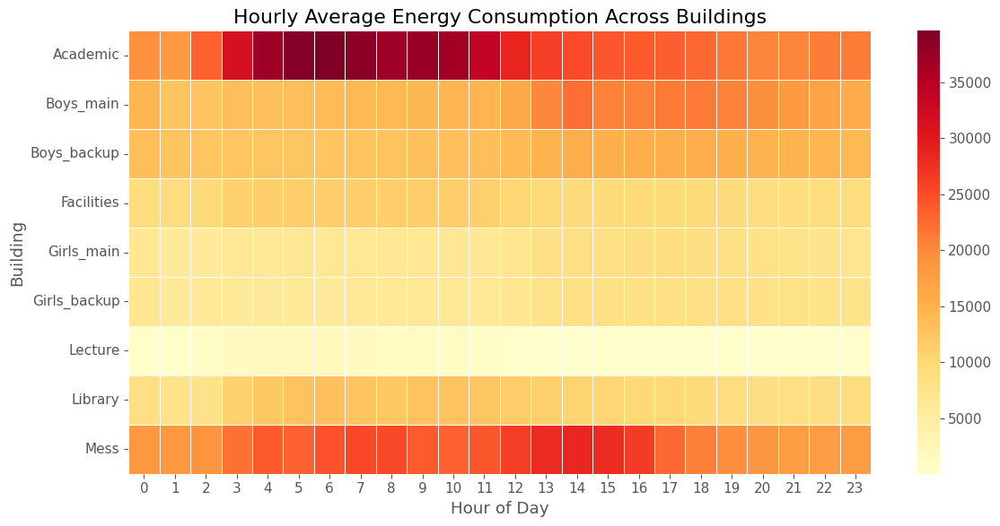

In [17]:
# =============================================================================
# HOURLY ENERGY HEATMAP
# =============================================================================

hourly_heatmap = (
    df.groupby("hour")[building_cols]
      .mean()
)

plt.figure(figsize=(12,6))

sns.heatmap(
    hourly_heatmap.T,
    cmap="YlOrRd",
    linewidths=0.5,
    annot=False
)

plt.title("Hourly Average Energy Consumption Across Buildings")

plt.xlabel("Hour of Day")

plt.ylabel("Building")

plt.tight_layout()

plt.show()

In [18]:
# =============================================================================
# MONTHLY ENERGY CONSUMPTION ANALYSIS
# =============================================================================

monthly_energy = (
    df.groupby("month")[building_cols]
      .mean()
      .reset_index()
)

print("="*80)
print("AVERAGE MONTHLY ENERGY CONSUMPTION")
print("="*80)

monthly_energy

AVERAGE MONTHLY ENERGY CONSUMPTION


,month,Academic,Boys_main,Boys_backup,Facilities,Girls_main,Girls_backup,Lecture,Library,Mess
0,1,25615.248322,17996.834374,11176.545165,8589.718271,6193.963010,5799.511607,778.990995,9652.189345,20690.191344
1,2,23813.514371,15971.827553,10822.242639,7690.431222,5808.675999,5593.233344,182.433947,10069.617104,20316.419288
2,3,23967.866718,13408.675075,11474.028371,7892.604473,5242.490109,5949.270675,141.780325,8533.569805,19728.146732
3,4,30063.694821,17106.852469,15957.471031,10894.237168,7202.801053,8321.027072,850.401475,11102.179479,26071.879546
4,5,30103.352616,13651.377073,11981.497534,12862.144957,6832.973044,6817.702578,327.410444,11156.422888,24626.414274
5,6,30761.370433,12751.252877,11984.138052,13638.540163,8514.931736,6775.447276,261.726536,11814.738321,24332.083680
6,7,31404.809930,14542.405858,13903.777454,12274.814542,8788.412600,7290.154895,577.862417,14072.554799,23697.207895
7,8,34249.115830,20646.051546,17944.897708,11333.508853,9312.269172,8001.463957,1410.122093,14193.548850,26391.065693
8,9,33366.965359,22697.541343,18835.484773,10807.365077,8970.483925,8677.093915,1483.103234,10269.115557,26872.414502
9,10,28760.278734,20149.884430,17111.958994,9884.599941,7487.252385,7819.993112,1027.616199,9072.976072,22419.638493


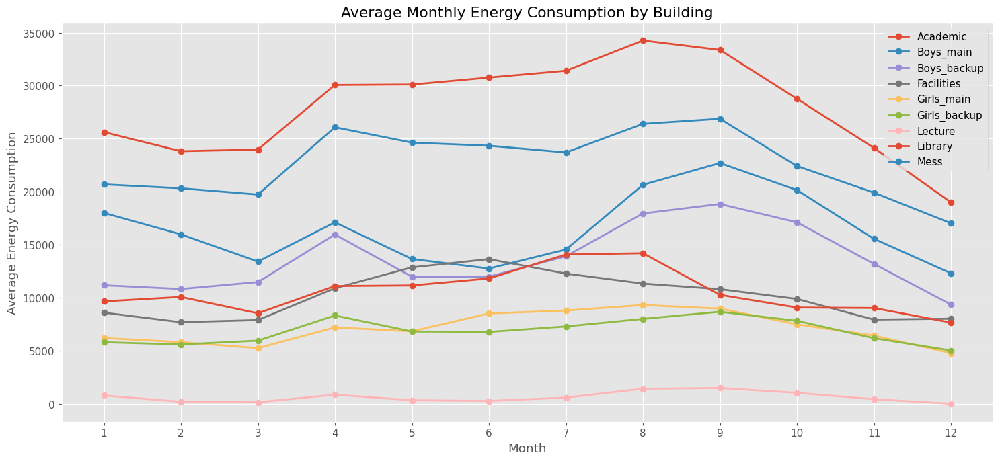

In [19]:
# =============================================================================
# MONTHLY ENERGY CONSUMPTION TREND
# =============================================================================

plt.figure(figsize=(15,7))

for col in building_cols:
    plt.plot(
        monthly_energy["month"],
        monthly_energy[col],
        marker="o",
        linewidth=2,
        label=col
    )

plt.title("Average Monthly Energy Consumption by Building")

plt.xlabel("Month")

plt.ylabel("Average Energy Consumption")

plt.xticks(range(1,13))

plt.grid(True)

plt.legend(loc="best")

plt.tight_layout()

plt.show()

In [20]:
# =============================================================================
# PEAK MONTH
# =============================================================================

peak_month = pd.DataFrame(
    columns=["Building","Peak Month","Average Consumption"]
)

for col in building_cols:

    idx = monthly_energy[col].idxmax()

    peak_month.loc[len(peak_month)] = [
        col,
        monthly_energy.loc[idx,"month"],
        monthly_energy.loc[idx,col]
    ]

peak_month

,Building,Peak Month,Average Consumption
0,Academic,8,34249.115830
1,Boys_main,9,22697.541343
2,Boys_backup,9,18835.484773
3,Facilities,6,13638.540163
4,Girls_main,8,9312.269172
5,Girls_backup,9,8677.093915
6,Lecture,9,1483.103234
7,Library,8,14193.548850
8,Mess,9,26872.414502


In [21]:
# =============================================================================
# LOWEST MONTH
# =============================================================================

lowest_month = pd.DataFrame(
    columns=["Building","Lowest Month","Average Consumption"]
)

for col in building_cols:

    idx = monthly_energy[col].idxmin()

    lowest_month.loc[len(lowest_month)] = [
        col,
        monthly_energy.loc[idx,"month"],
        monthly_energy.loc[idx,col]
    ]

lowest_month

,Building,Lowest Month,Average Consumption
0,Academic,12,19000.267619
1,Boys_main,12,12302.188630
2,Boys_backup,12,9357.738946
3,Facilities,2,7690.431222
4,Girls_main,12,4764.547357
5,Girls_backup,12,5018.820636
6,Lecture,12,5.556390
7,Library,12,7656.638770
8,Mess,12,17024.456355


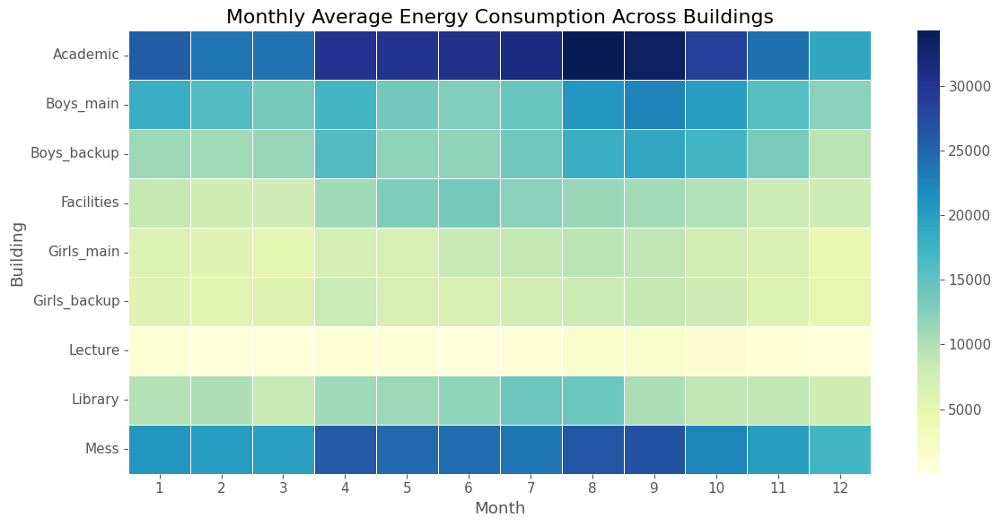

In [22]:
# =============================================================================
# MONTHLY ENERGY HEATMAP
# =============================================================================

monthly_heatmap = (
    df.groupby("month")[building_cols]
      .mean()
)

plt.figure(figsize=(12,6))

sns.heatmap(
    monthly_heatmap.T,
    cmap="YlGnBu",
    annot=False,
    linewidths=0.5
)

plt.title("Monthly Average Energy Consumption Across Buildings")

plt.xlabel("Month")

plt.ylabel("Building")

plt.tight_layout()

plt.show()

In [23]:
# =============================================================================
# YEARLY ENERGY CONSUMPTION ANALYSIS
# =============================================================================

yearly_energy = (
    df.groupby("year")[building_cols]
      .mean()
      .reset_index()
)

print("="*80)
print("AVERAGE YEARLY ENERGY CONSUMPTION")
print("="*80)

yearly_energy

AVERAGE YEARLY ENERGY CONSUMPTION


,year,Academic,Boys_main,Boys_backup,Facilities,Girls_main,Girls_backup,Lecture,Library,Mess
0,2013,24246.300818,17713.166209,10430.810707,4053.108373,6779.519393,5880.733675,1038.250319,7024.945813,18008.340852
1,2014,24183.273798,14901.768058,11628.498939,8520.477302,6739.822973,5488.370572,649.113851,7457.718284,19162.007066
2,2015,27665.832337,16813.519764,14964.258787,10502.661948,7962.216802,7336.519271,448.339550,16207.184042,21954.808160
3,2016,29770.471569,13896.940326,13534.932882,11741.179588,5971.797684,7530.713360,596.044925,10350.802030,27273.752204
4,2017,31460.572887,20140.204496,16331.170856,12031.547393,8052.585568,7544.349545,726.112684,9292.705041,23974.515287


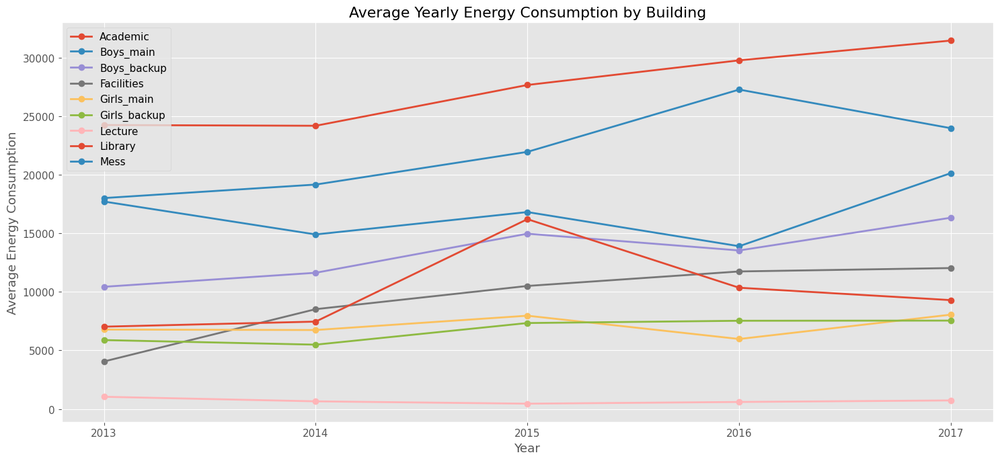

In [24]:
# =============================================================================
# YEARLY ENERGY TREND
# =============================================================================

plt.figure(figsize=(15,7))

for col in building_cols:
    plt.plot(
        yearly_energy["year"],
        yearly_energy[col],
        marker="o",
        linewidth=2,
        label=col
    )

plt.title("Average Yearly Energy Consumption by Building")

plt.xlabel("Year")

plt.ylabel("Average Energy Consumption")

plt.xticks(yearly_energy["year"])

plt.grid(True)

plt.legend()

plt.tight_layout()

plt.show()

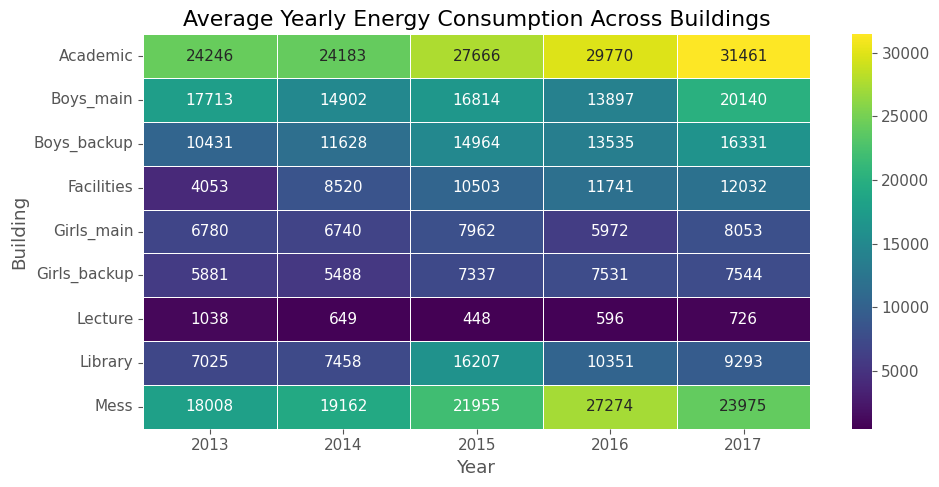

In [25]:
# =============================================================================
# YEARLY ENERGY HEATMAP
# =============================================================================

yearly_heatmap = (
    df.groupby("year")[building_cols]
      .mean()
)

plt.figure(figsize=(10,5))

sns.heatmap(
    yearly_heatmap.T,
    cmap="viridis",
    annot=True,
    fmt=".0f",
    linewidths=0.5
)

plt.title("Average Yearly Energy Consumption Across Buildings")

plt.xlabel("Year")

plt.ylabel("Building")

plt.tight_layout()

plt.show()

In [26]:
# =============================================================================
# WEATHER VARIABLE SUMMARY
# =============================================================================

weather_summary = df[weather_cols].describe().T

print("="*80)
print("WEATHER VARIABLE SUMMARY")
print("="*80)

weather_summary

WEATHER VARIABLE SUMMARY


,count,mean,std,min,25%,50%,75%,max
ALLSKY_SFC_SW_DWN,2310238.0,200.706851,64.862564,20.75,151.10,200.38,253.32,350.10
WS2M,2310238.0,1.841669,0.758223,0.48,1.28,1.72,2.26,5.72
PRECTOTCORR,2310238.0,1.967058,6.044310,0.00,0.00,0.00,0.66,88.39


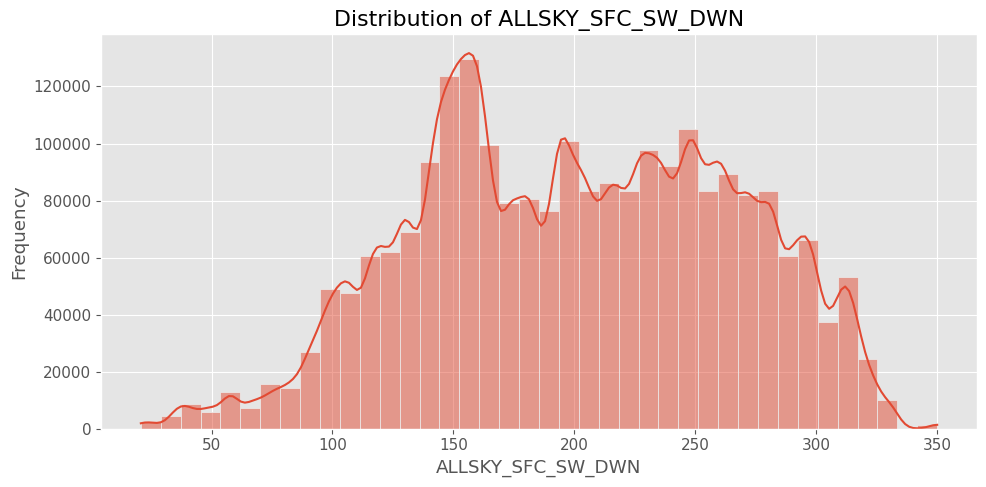

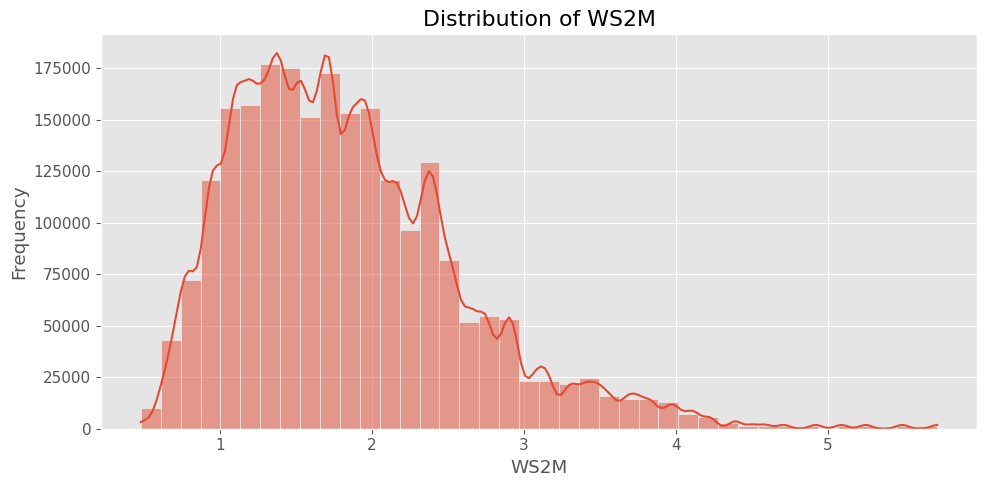

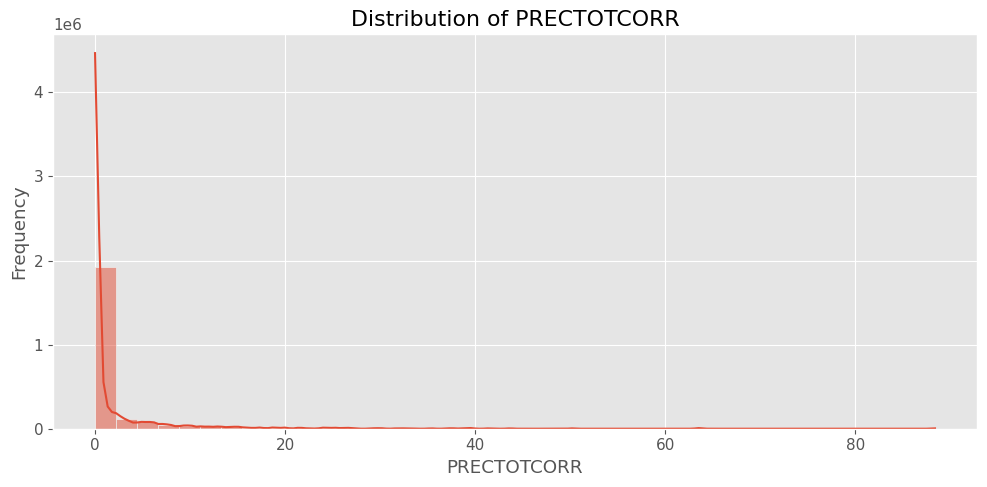

In [27]:
# =============================================================================
# WEATHER VARIABLE DISTRIBUTION
# =============================================================================

for col in weather_cols:

    plt.figure(figsize=(10,5))

    sns.histplot(
        df[col],
        bins=40,
        kde=True
    )

    plt.title(f"Distribution of {col}")

    plt.xlabel(col)

    plt.ylabel("Frequency")

    plt.tight_layout()

    plt.show()

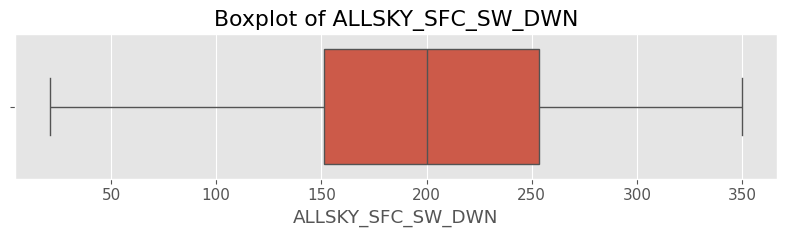

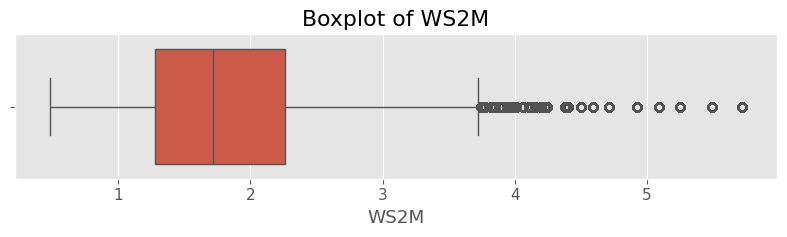

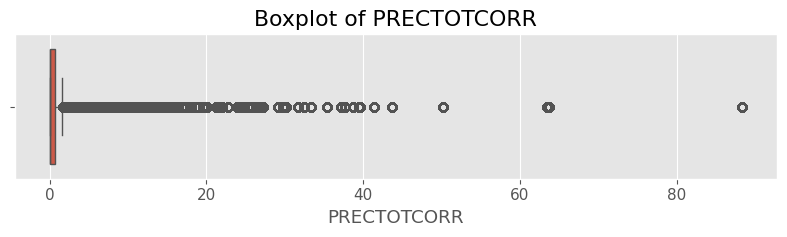

In [28]:
# =============================================================================
# WEATHER OUTLIER ANALYSIS
# =============================================================================

for col in weather_cols:

    plt.figure(figsize=(8,2.5))

    sns.boxplot(
        x=df[col]
    )

    plt.title(f"Boxplot of {col}")

    plt.tight_layout()

    plt.show()

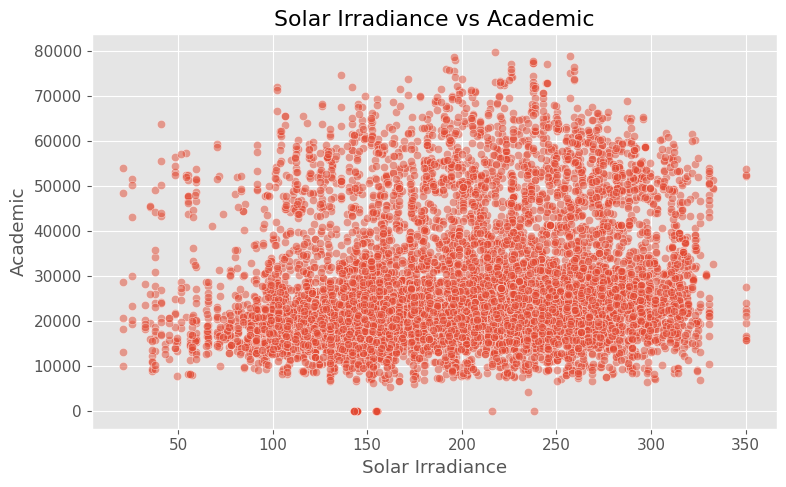

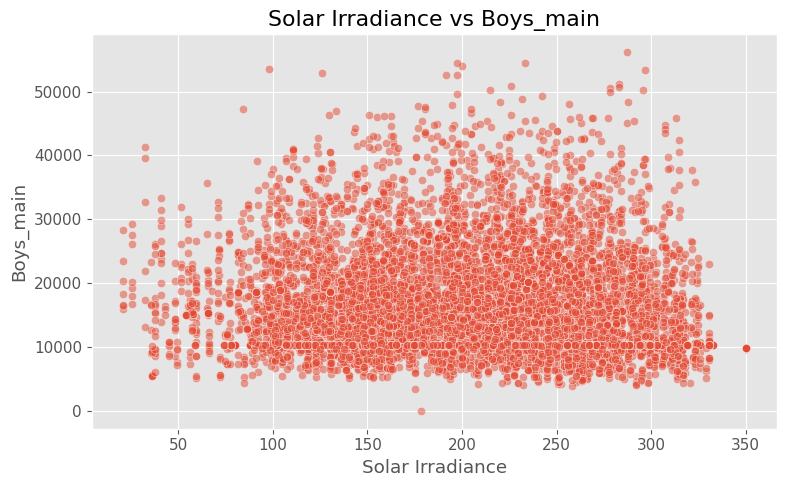

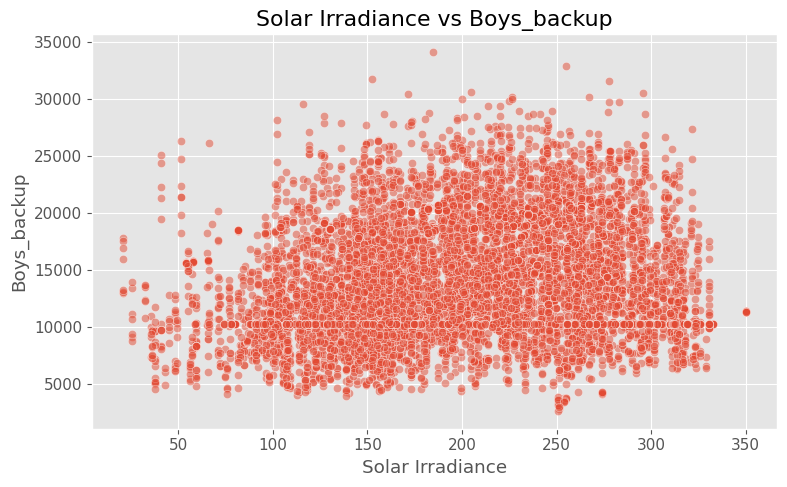

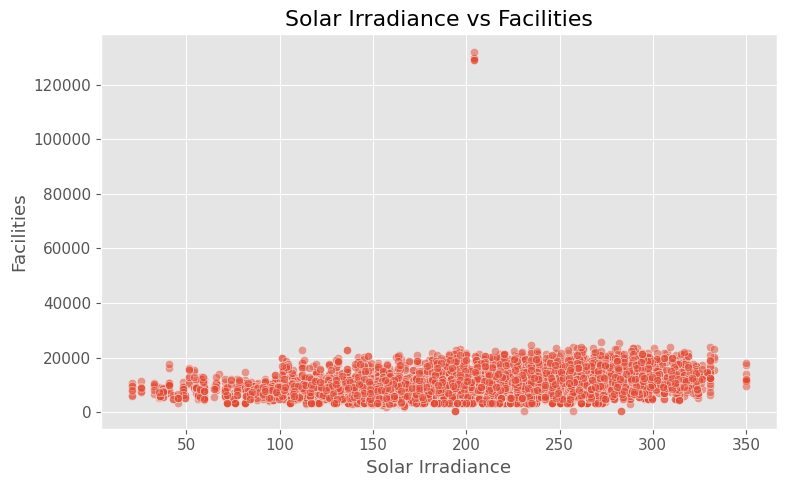

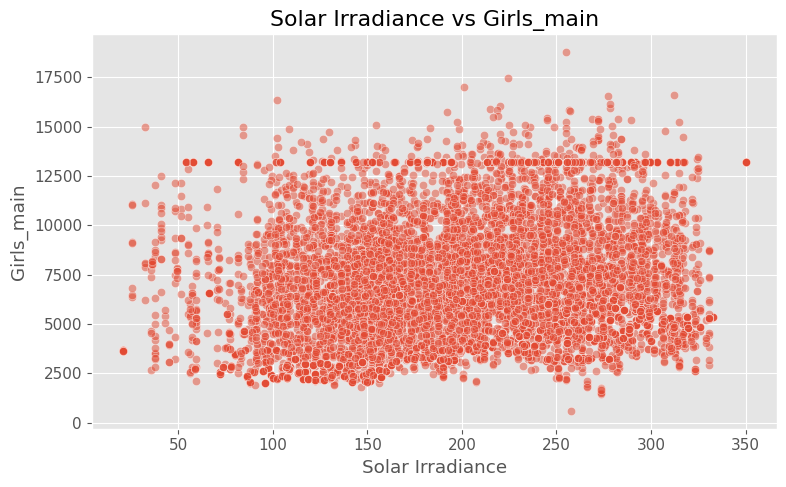

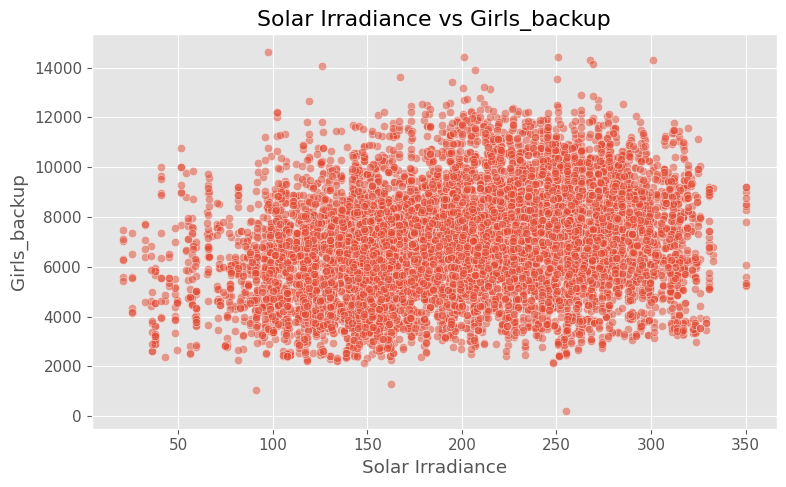

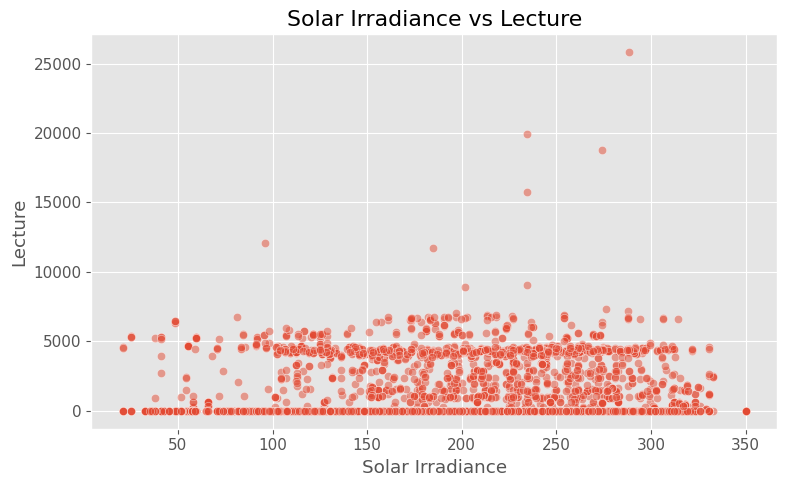

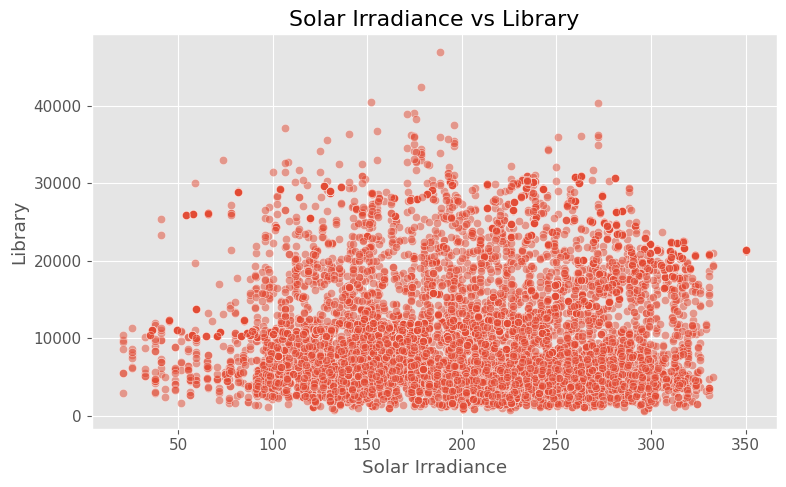

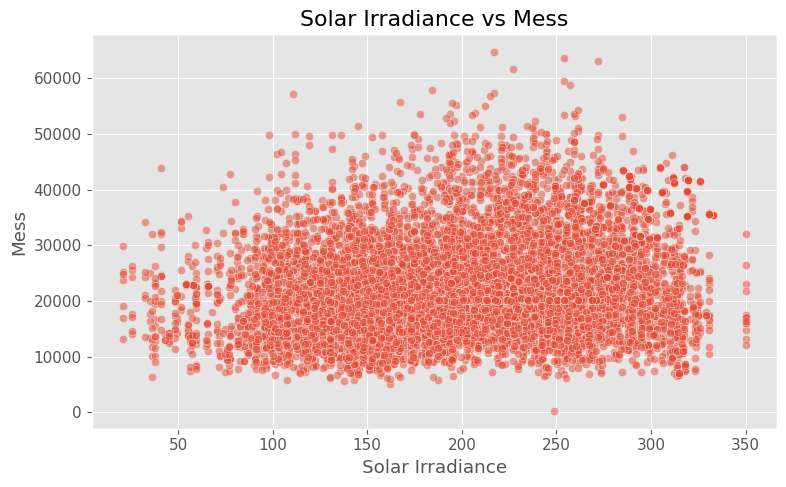

In [29]:
# =============================================================================
# SOLAR IRRADIANCE VS BUILDING ENERGY
# =============================================================================

for col in building_cols:

    plt.figure(figsize=(8,5))

    sns.scatterplot(
        data=df.sample(10000, random_state=42),
        x="ALLSKY_SFC_SW_DWN",
        y=col,
        alpha=0.5
    )

    plt.title(f"Solar Irradiance vs {col}")

    plt.xlabel("Solar Irradiance")

    plt.ylabel(col)

    plt.tight_layout()

    plt.show()

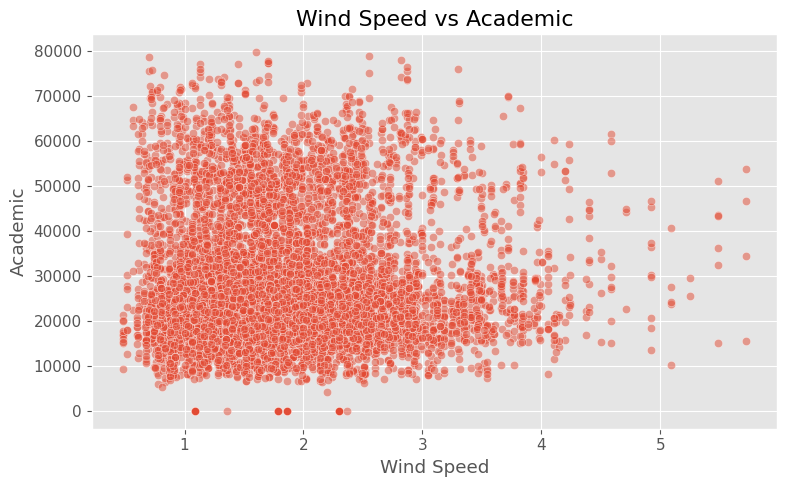

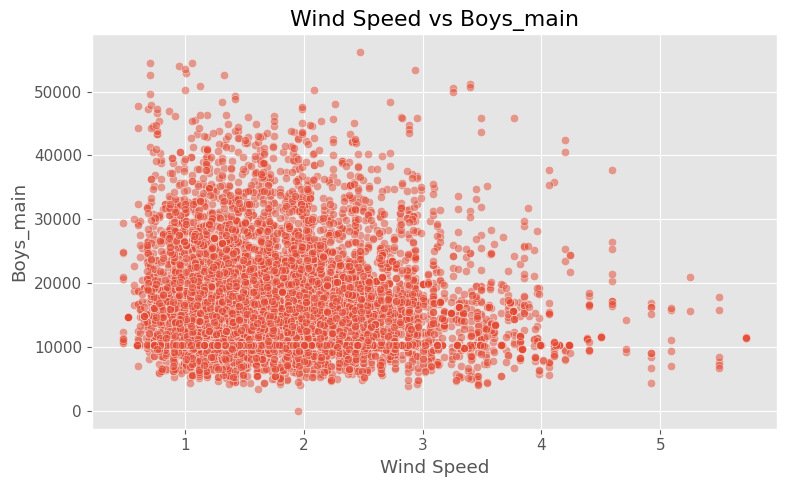

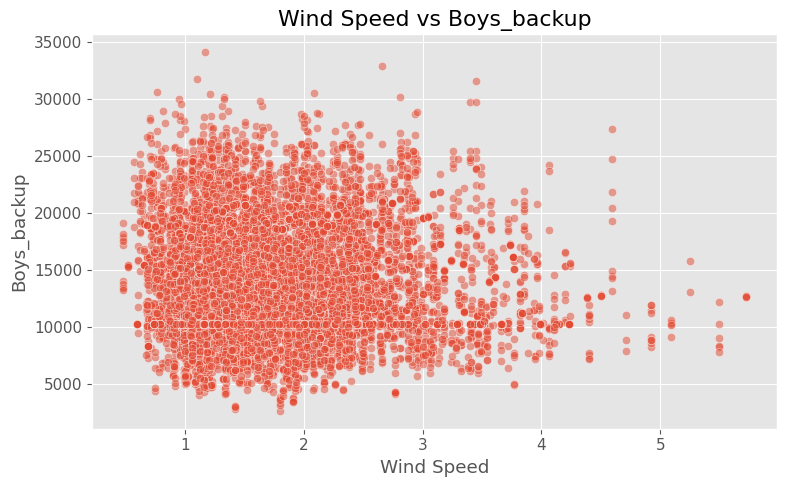

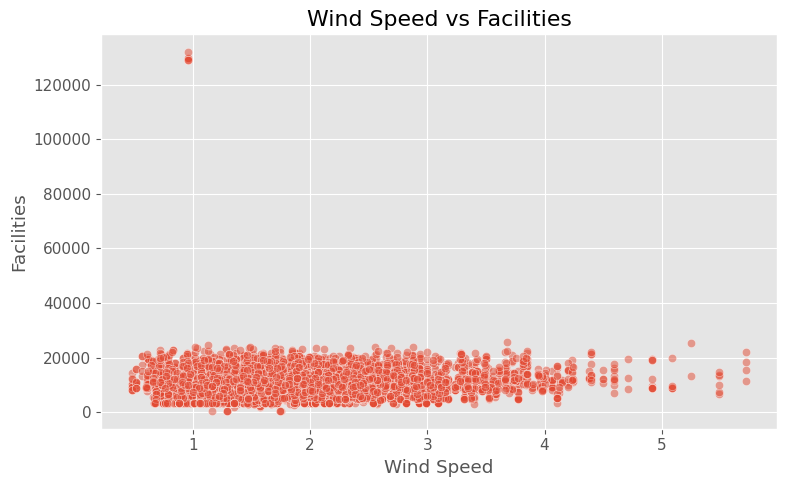

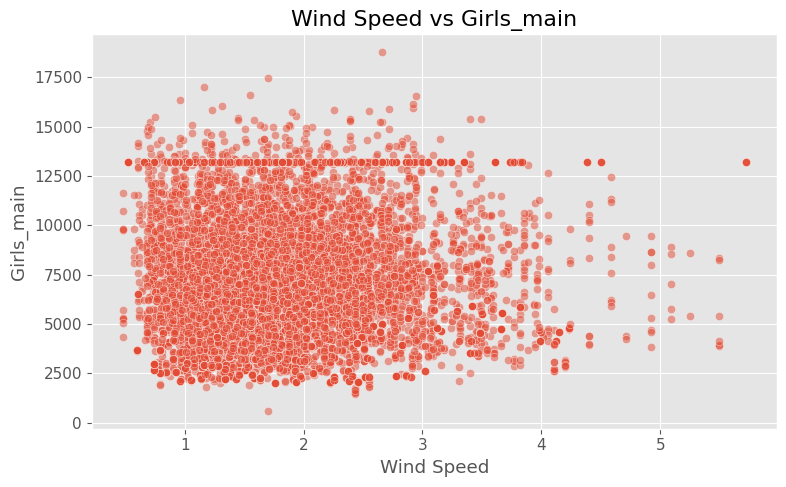

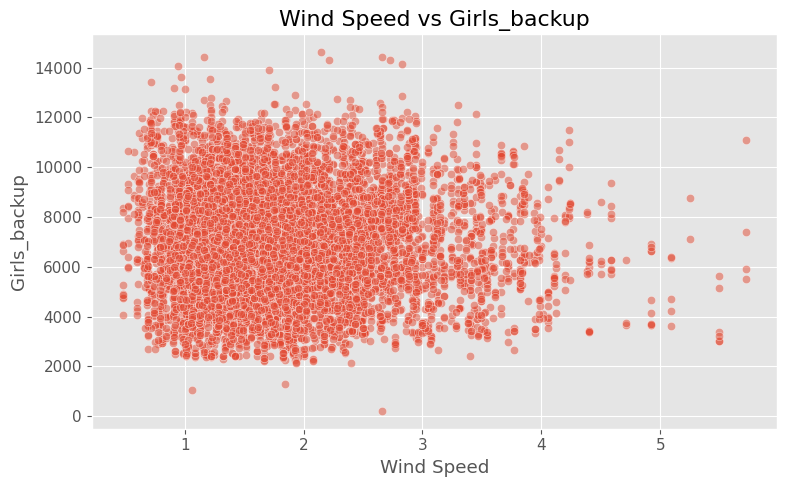

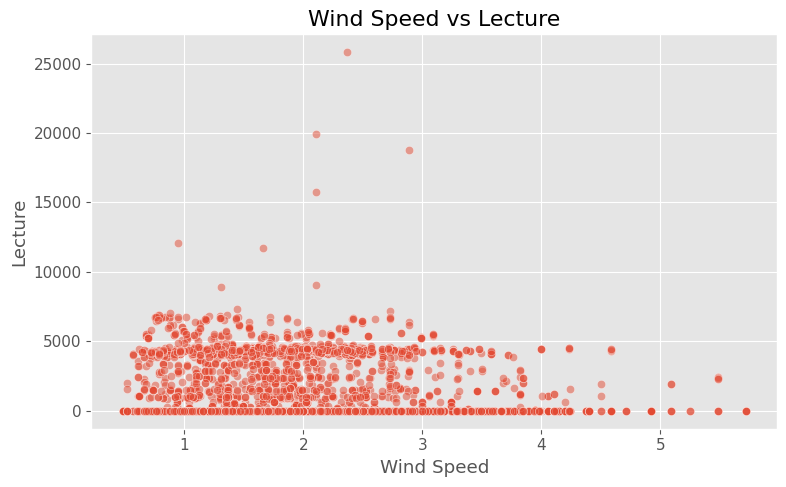

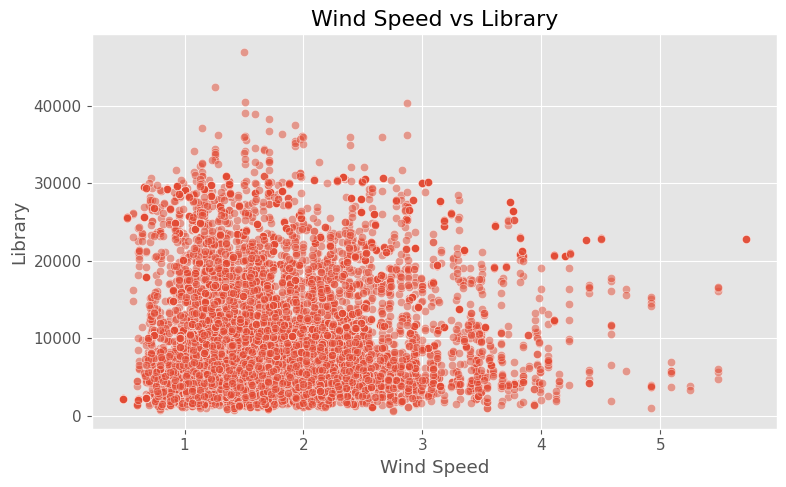

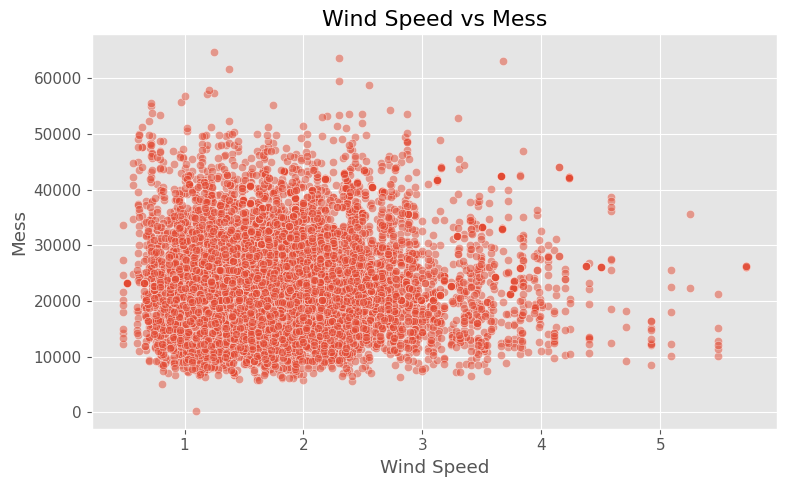

In [30]:
# =============================================================================
# WIND SPEED VS BUILDING ENERGY
# =============================================================================

for col in building_cols:

    plt.figure(figsize=(8,5))

    sns.scatterplot(
        data=df.sample(10000, random_state=42),
        x="WS2M",
        y=col,
        alpha=0.5
    )

    plt.title(f"Wind Speed vs {col}")

    plt.xlabel("Wind Speed")

    plt.ylabel(col)

    plt.tight_layout()

    plt.show()

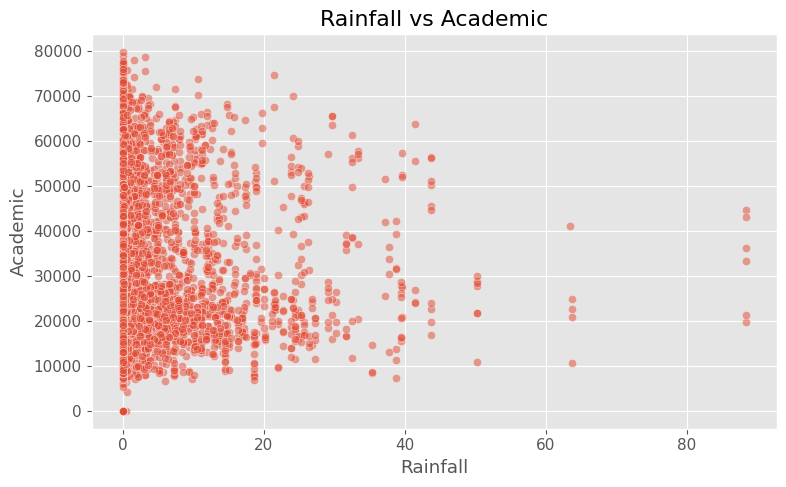

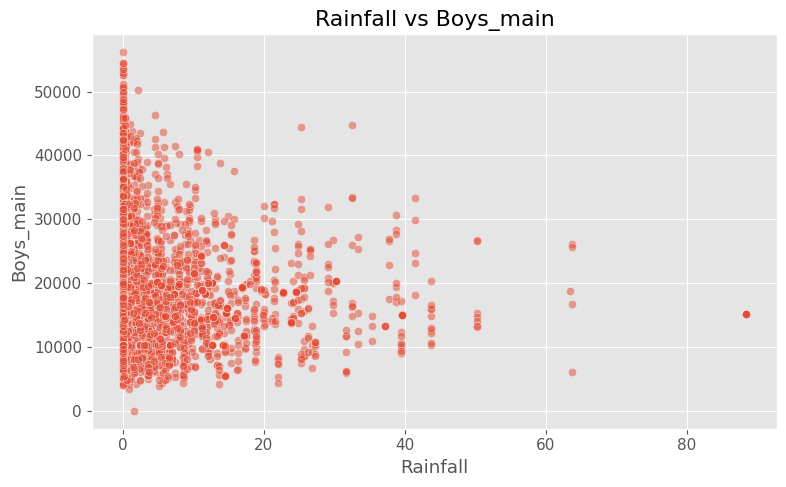

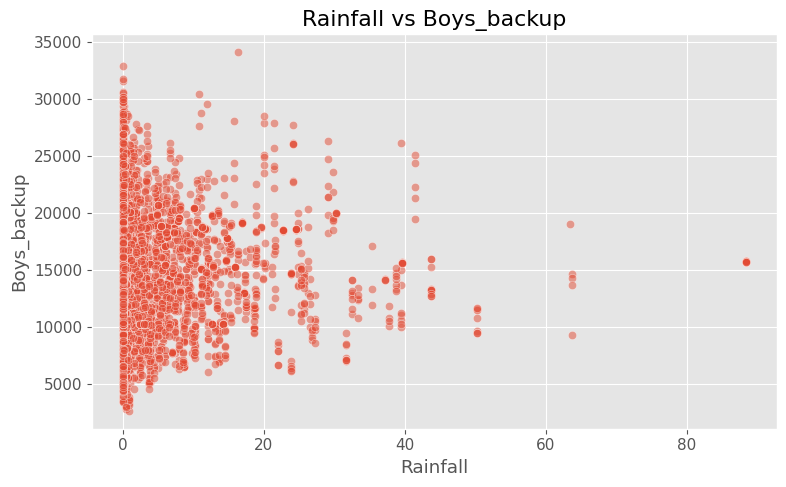

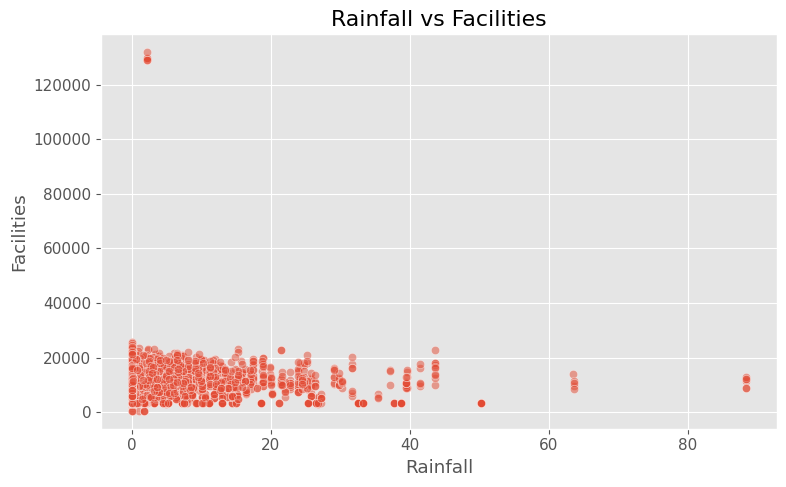

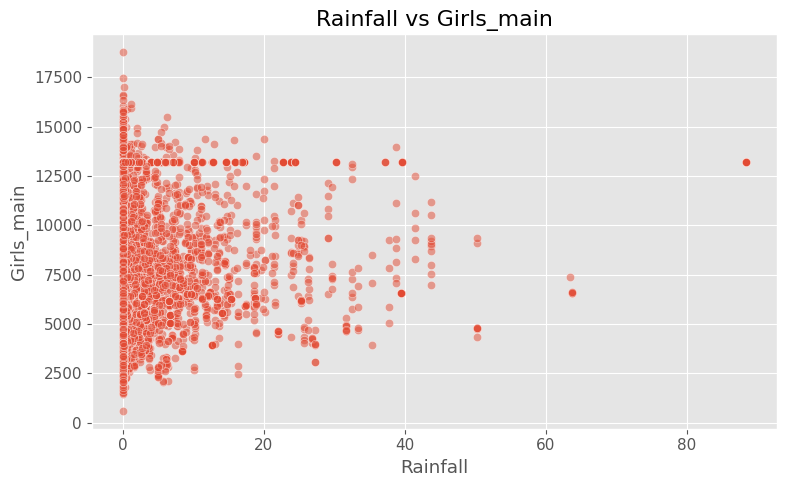

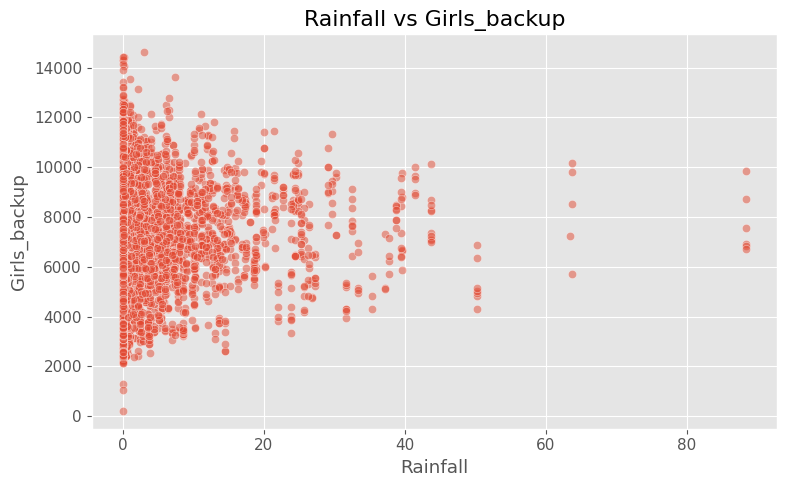

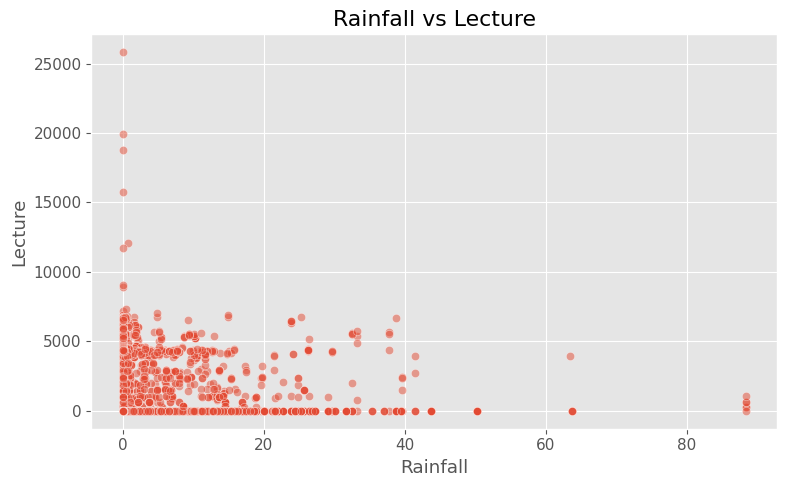

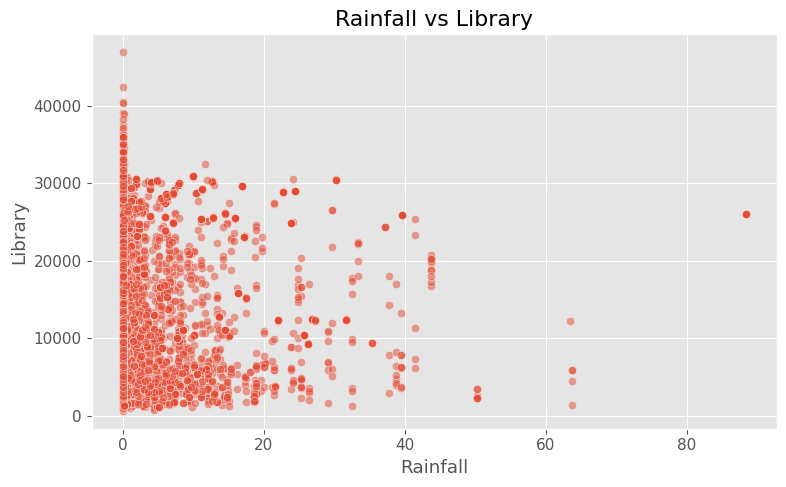

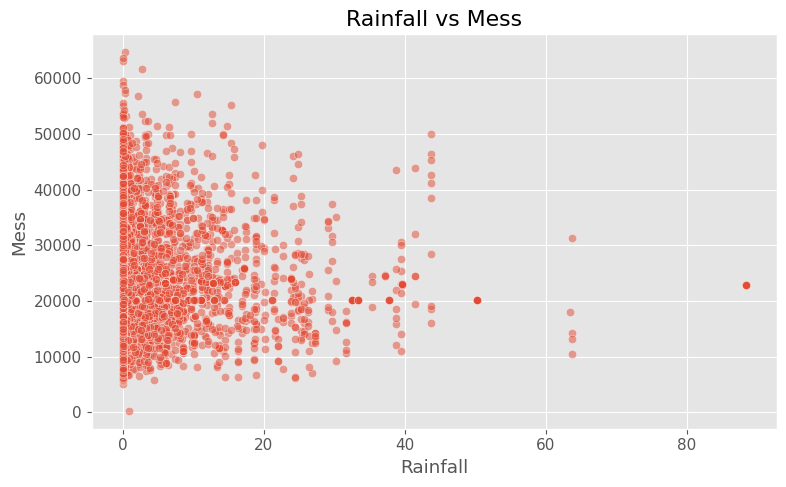

In [31]:
# =============================================================================
# RAINFALL VS BUILDING ENERGY
# =============================================================================

for col in building_cols:

    plt.figure(figsize=(8,5))

    sns.scatterplot(
        data=df.sample(10000, random_state=42),
        x="PRECTOTCORR",
        y=col,
        alpha=0.5
    )

    plt.title(f"Rainfall vs {col}")

    plt.xlabel("Rainfall")

    plt.ylabel(col)

    plt.tight_layout()

    plt.show()

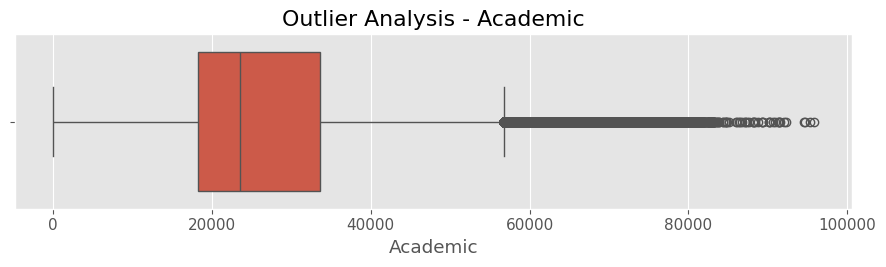

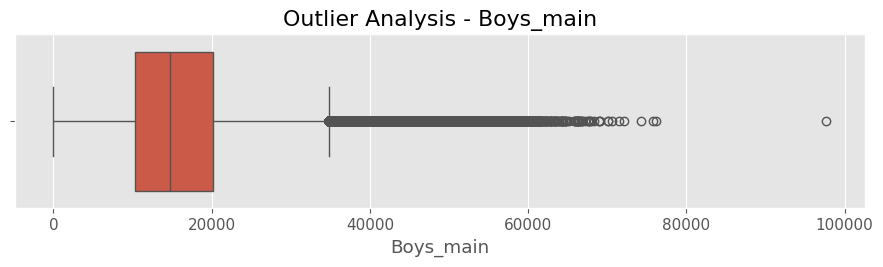

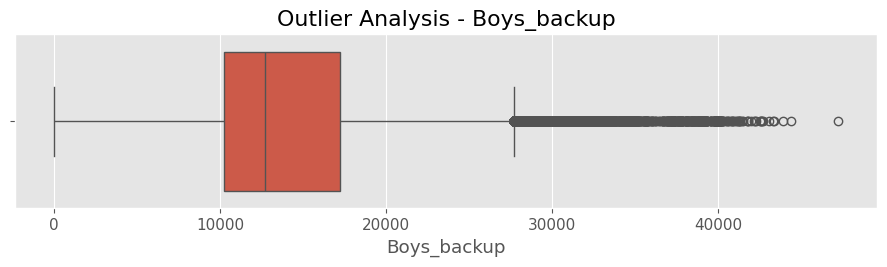

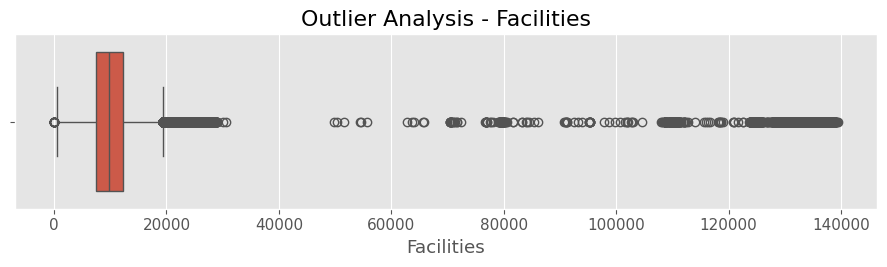

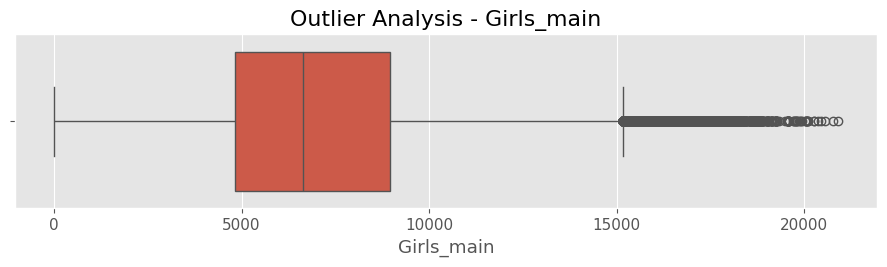

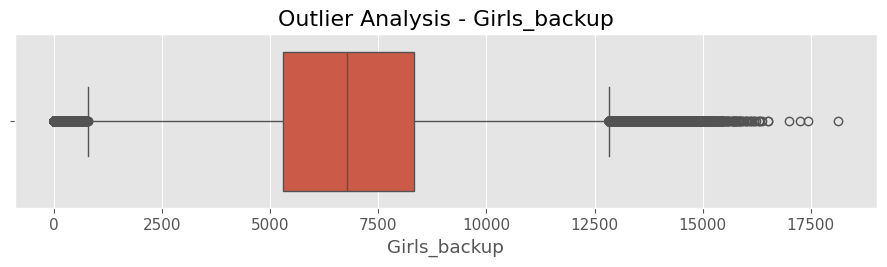

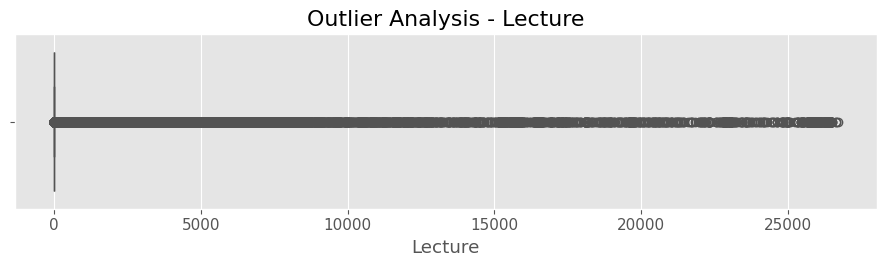

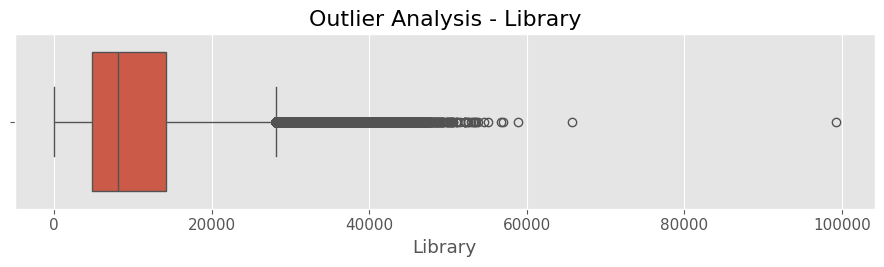

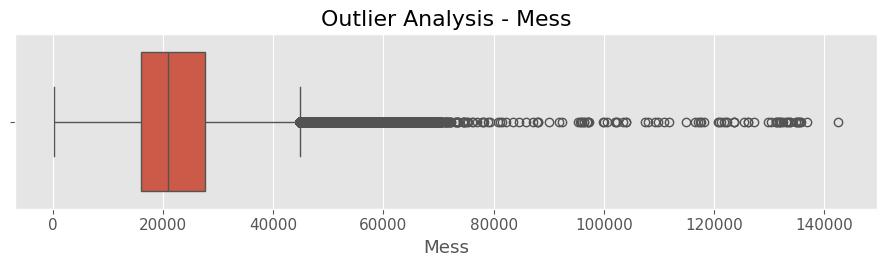

In [32]:
# =============================================================================
# BUILDING ENERGY OUTLIER ANALYSIS
# =============================================================================

for col in building_cols:

    plt.figure(figsize=(9,2.8))

    sns.boxplot(
        x=df[col]
    )

    plt.title(f"Outlier Analysis - {col}")

    plt.tight_layout()

    plt.show()

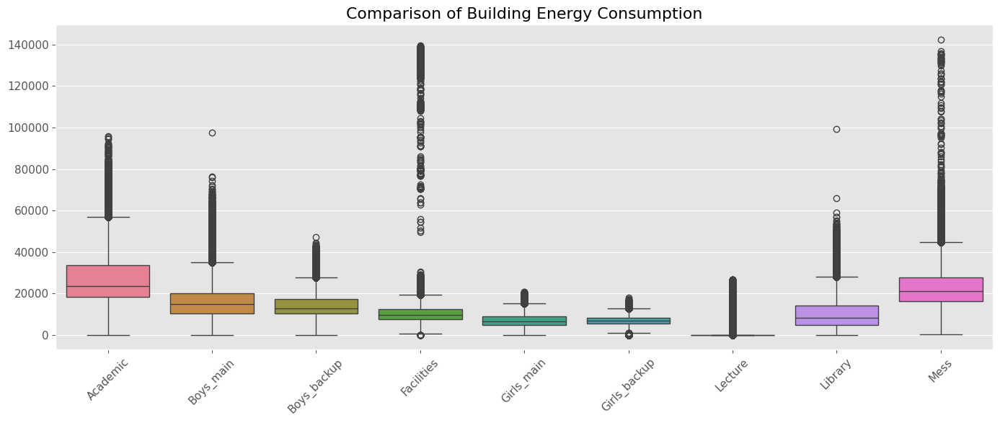

In [33]:
# =============================================================================
# BUILDING ENERGY COMPARISON
# =============================================================================

plt.figure(figsize=(14,6))

sns.boxplot(
    data=df[building_cols]
)

plt.xticks(rotation=45)

plt.title("Comparison of Building Energy Consumption")

plt.tight_layout()

plt.show()

In [34]:
# =============================================================================
# EDA COMPLETED
# =============================================================================

print("="*80)
print("EXPLORATORY DATA ANALYSIS COMPLETED SUCCESSFULLY")
print("="*80)

print("""
Completed Analyses

1. Energy Consumption Distribution
2. Correlation Analysis
3. Hourly Energy Consumption
4. Monthly Energy Consumption
5. Yearly Energy Consumption
6. Weather Variable Analysis
7. Weather vs Energy Relationships
8. Outlier Analysis

The results from this notebook will support feature engineering,
machine learning model development, and explainable AI analysis.
""")

EXPLORATORY DATA ANALYSIS COMPLETED SUCCESSFULLY

Completed Analyses

1. Energy Consumption Distribution
2. Correlation Analysis
3. Hourly Energy Consumption
4. Monthly Energy Consumption
5. Yearly Energy Consumption
6. Weather Variable Analysis
7. Weather vs Energy Relationships
8. Outlier Analysis

The results from this notebook will support feature engineering,
machine learning model development, and explainable AI analysis.



In [35]:
df["Total_Energy"] = df[building_cols].sum(axis=1)

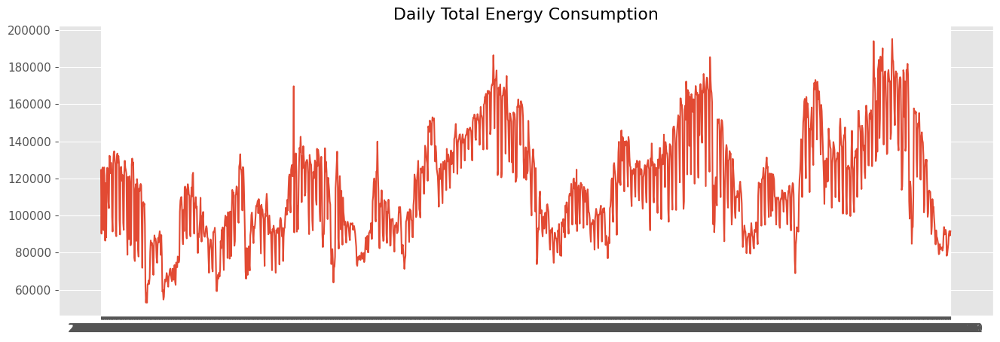

In [36]:
daily_energy = (
    df.groupby("date")["Total_Energy"]
      .mean()
)

plt.figure(figsize=(16,5))

plt.plot(daily_energy)

plt.title("Daily Total Energy Consumption")

plt.show()

In [ ]:
corr = df.corr(numeric_only=True)

corr["Total_Energy"].sort_values(ascending=False)


Total_Energy         1.000000
Academic             0.775792
Mess                 0.707678
Boys_backup          0.628074
Library              0.620390
Facilities           0.566728
Girls_backup         0.562279
Girls_main           0.510164
Lecture              0.482892
Boys_main            0.442698
timestamp            0.343972
year                 0.336807
ALLSKY_SFC_SW_DWN    0.237414
PRECTOTCORR          0.095090
day                  0.014720
month                0.012882
WS2M                 0.007706
hour                -0.011497
Name: Total_Energy, dtype: float64

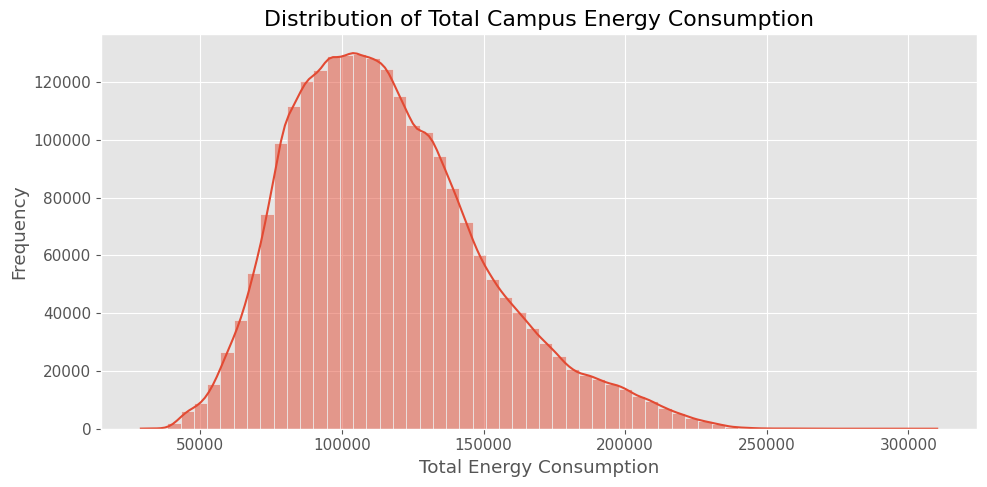

In [38]:
# =============================================================================
# TOTAL ENERGY DISTRIBUTION
# =============================================================================

plt.figure(figsize=(10,5))

sns.histplot(
    df["Total_Energy"],
    bins=60,
    kde=True
)

plt.title("Distribution of Total Campus Energy Consumption")

plt.xlabel("Total Energy Consumption")

plt.ylabel("Frequency")

plt.tight_layout()

plt.show()

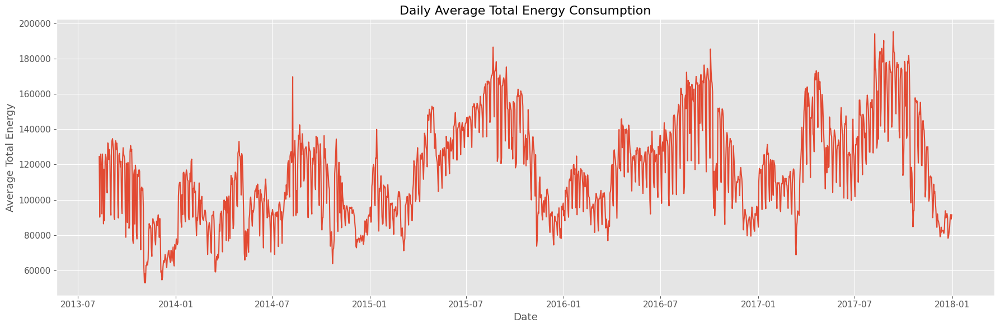

In [39]:
# =============================================================================
# DAILY TOTAL ENERGY TREND
# =============================================================================

daily_energy = (
    df.groupby("date")["Total_Energy"]
      .mean()
      .reset_index()
)

daily_energy["date"] = pd.to_datetime(daily_energy["date"])

plt.figure(figsize=(18,6))

plt.plot(
    daily_energy["date"],
    daily_energy["Total_Energy"],
    linewidth=1.5
)

plt.title("Daily Average Total Energy Consumption")

plt.xlabel("Date")

plt.ylabel("Average Total Energy")

plt.tight_layout()

plt.show()

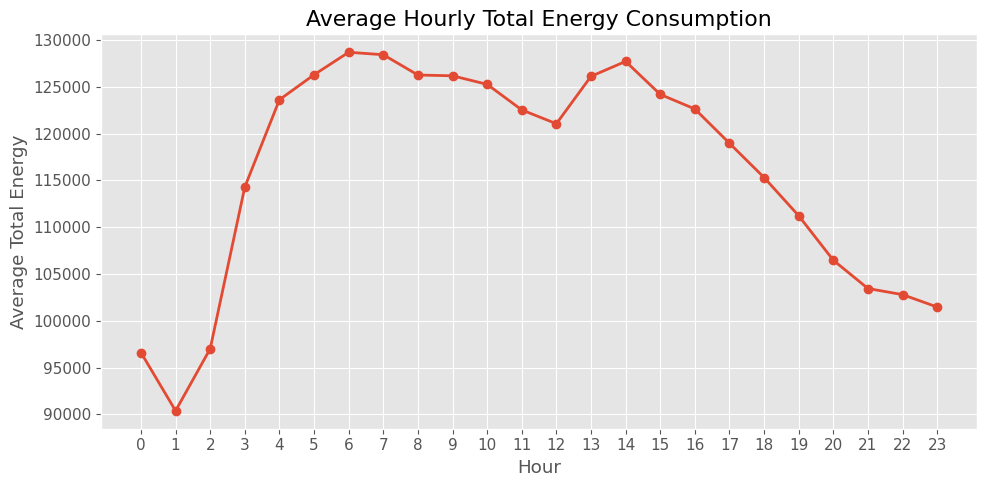

In [40]:
# =============================================================================
# HOURLY TOTAL ENERGY CONSUMPTION
# =============================================================================

hourly_total = (
    df.groupby("hour")["Total_Energy"]
      .mean()
      .reset_index()
)

plt.figure(figsize=(10,5))

plt.plot(
    hourly_total["hour"],
    hourly_total["Total_Energy"],
    marker="o",
    linewidth=2
)

plt.xticks(range(24))

plt.grid(True)

plt.title("Average Hourly Total Energy Consumption")

plt.xlabel("Hour")

plt.ylabel("Average Total Energy")

plt.tight_layout()

plt.show()

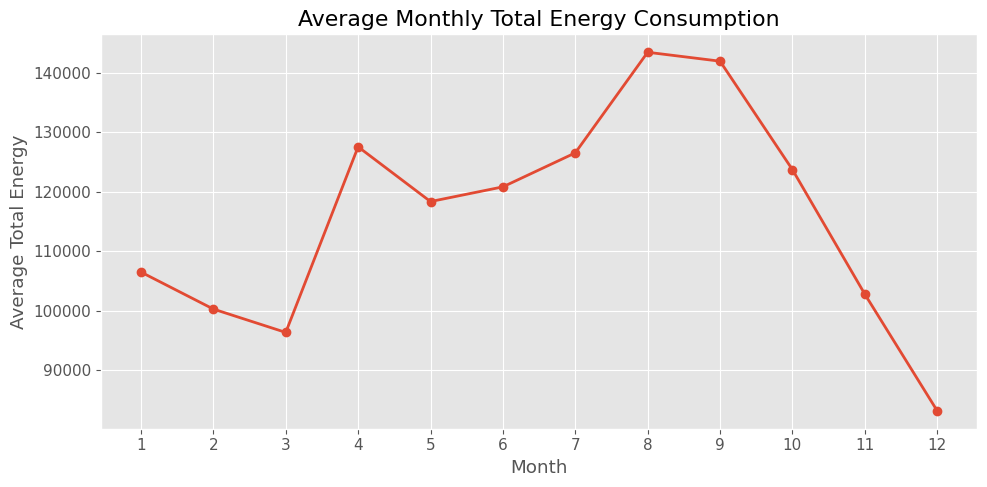

In [41]:
# =============================================================================
# MONTHLY TOTAL ENERGY CONSUMPTION
# =============================================================================

monthly_total = (
    df.groupby("month")["Total_Energy"]
      .mean()
      .reset_index()
)

plt.figure(figsize=(10,5))

plt.plot(
    monthly_total["month"],
    monthly_total["Total_Energy"],
    marker="o",
    linewidth=2
)

plt.xticks(range(1,13))

plt.grid(True)

plt.title("Average Monthly Total Energy Consumption")

plt.xlabel("Month")

plt.ylabel("Average Total Energy")

plt.tight_layout()

plt.show()

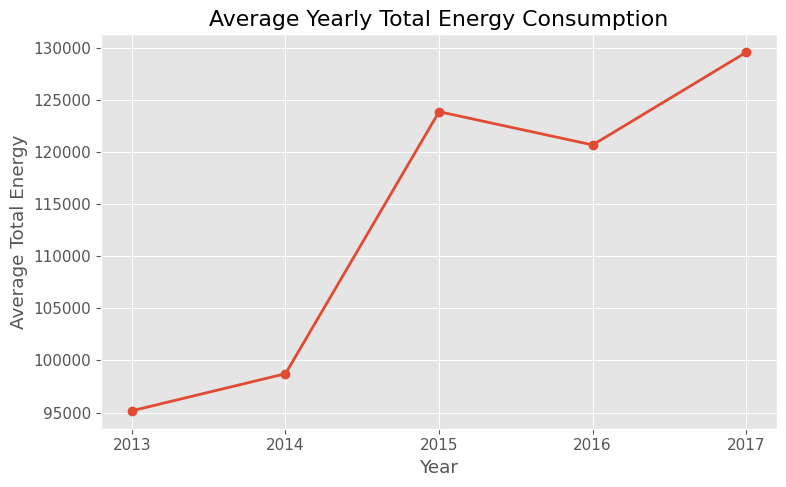

In [42]:
# =============================================================================
# YEARLY TOTAL ENERGY CONSUMPTION
# =============================================================================

yearly_total = (
    df.groupby("year")["Total_Energy"]
      .mean()
      .reset_index()
)

plt.figure(figsize=(8,5))

plt.plot(
    yearly_total["year"],
    yearly_total["Total_Energy"],
    marker="o",
    linewidth=2
)

plt.xticks(yearly_total["year"])

plt.grid(True)

plt.title("Average Yearly Total Energy Consumption")

plt.xlabel("Year")

plt.ylabel("Average Total Energy")

plt.tight_layout()

plt.show()

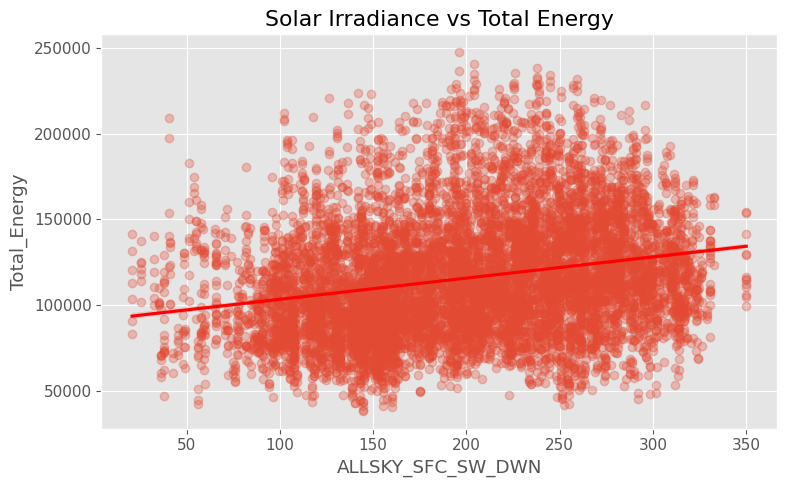

In [43]:
# =============================================================================
# SOLAR IRRADIANCE VS TOTAL ENERGY
# =============================================================================

sample_df = df.sample(10000, random_state=42)

plt.figure(figsize=(8,5))

sns.regplot(
    data=sample_df,
    x="ALLSKY_SFC_SW_DWN",
    y="Total_Energy",
    scatter_kws={"alpha":0.3},
    line_kws={"color":"red"}
)

plt.title("Solar Irradiance vs Total Energy")

plt.tight_layout()

plt.show()

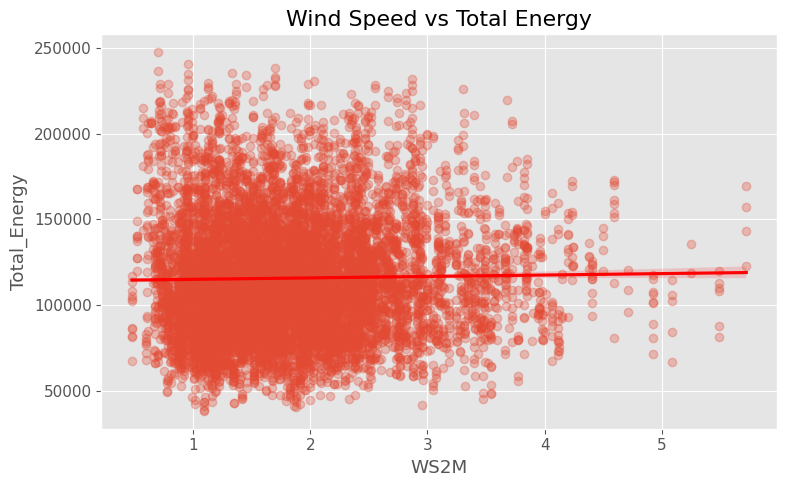

In [44]:
# =============================================================================
# WIND SPEED VS TOTAL ENERGY
# =============================================================================

plt.figure(figsize=(8,5))

sns.regplot(
    data=sample_df,
    x="WS2M",
    y="Total_Energy",
    scatter_kws={"alpha":0.3},
    line_kws={"color":"red"}
)

plt.title("Wind Speed vs Total Energy")

plt.tight_layout()

plt.show()

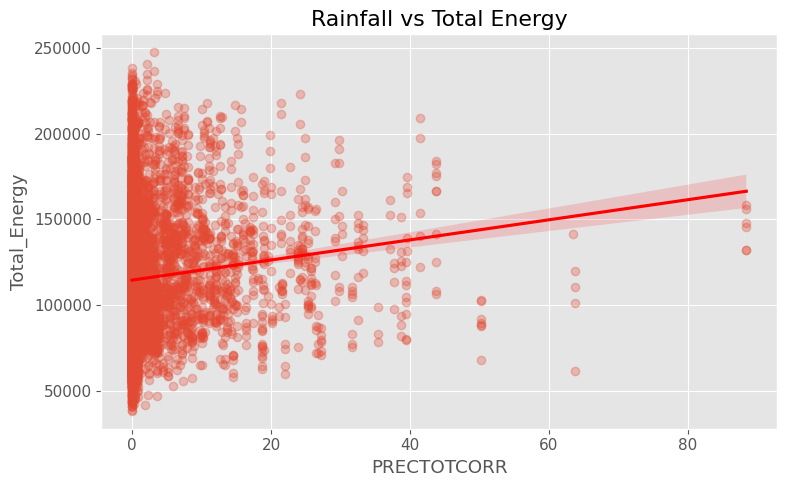

In [45]:
# =============================================================================
# RAINFALL VS TOTAL ENERGY
# =============================================================================

plt.figure(figsize=(8,5))

sns.regplot(
    data=sample_df,
    x="PRECTOTCORR",
    y="Total_Energy",
    scatter_kws={"alpha":0.3},
    line_kws={"color":"red"}
)

plt.title("Rainfall vs Total Energy")

plt.tight_layout()

plt.show()

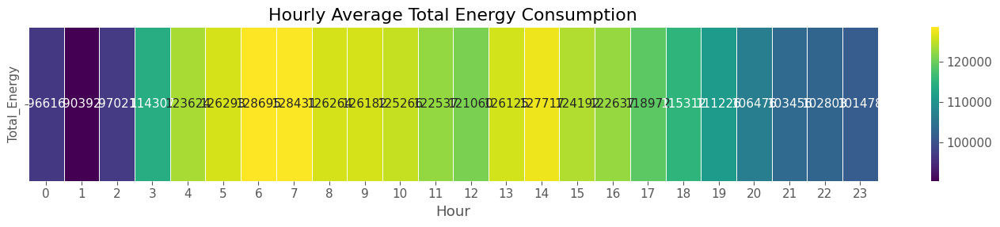

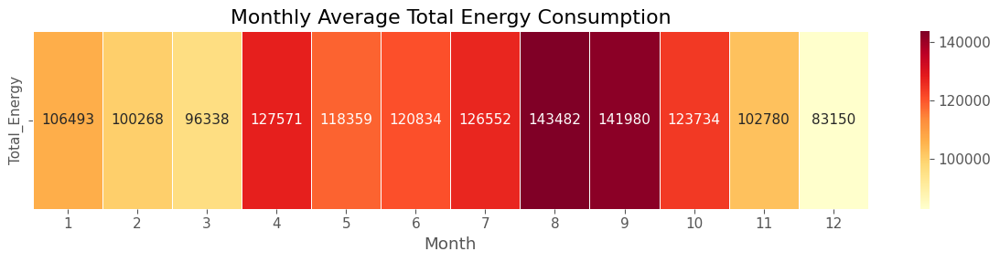

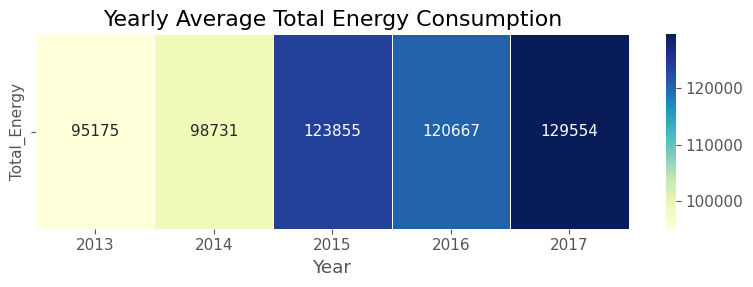

In [48]:
# =============================================================================
# TOTAL ENERGY HEATMAPS
# =============================================================================

# Hourly Total Energy Heatmap
hourly_total_heatmap = (
    df.groupby("hour")[["Total_Energy"]]
      .mean()
      .T
)

plt.figure(figsize=(14,3))

sns.heatmap(
    hourly_total_heatmap,
    annot=True,
    fmt=".0f",
    cmap="viridis",
    linewidths=0.5
)

plt.title("Hourly Average Total Energy Consumption")

plt.xlabel("Hour")

plt.ylabel("")

plt.tight_layout()

plt.show()


# =============================================================================
# Monthly Total Energy Heatmap
# =============================================================================

monthly_total_heatmap = (
    df.groupby("month")[["Total_Energy"]]
      .mean()
      .T
)

plt.figure(figsize=(12,3))

sns.heatmap(
    monthly_total_heatmap,
    annot=True,
    fmt=".0f",
    cmap="YlOrRd",
    linewidths=0.5
)

plt.title("Monthly Average Total Energy Consumption")

plt.xlabel("Month")

plt.ylabel("")

plt.tight_layout()

plt.show()


# =============================================================================
# Yearly Total Energy Heatmap
# =============================================================================

yearly_total_heatmap = (
    df.groupby("year")[["Total_Energy"]]
      .mean()
      .T
)

plt.figure(figsize=(8,3))

sns.heatmap(
    yearly_total_heatmap,
    annot=True,
    fmt=".0f",
    cmap="YlGnBu",
    linewidths=0.5
)

plt.title("Yearly Average Total Energy Consumption")

plt.xlabel("Year")

plt.ylabel("")

plt.tight_layout()

plt.show()

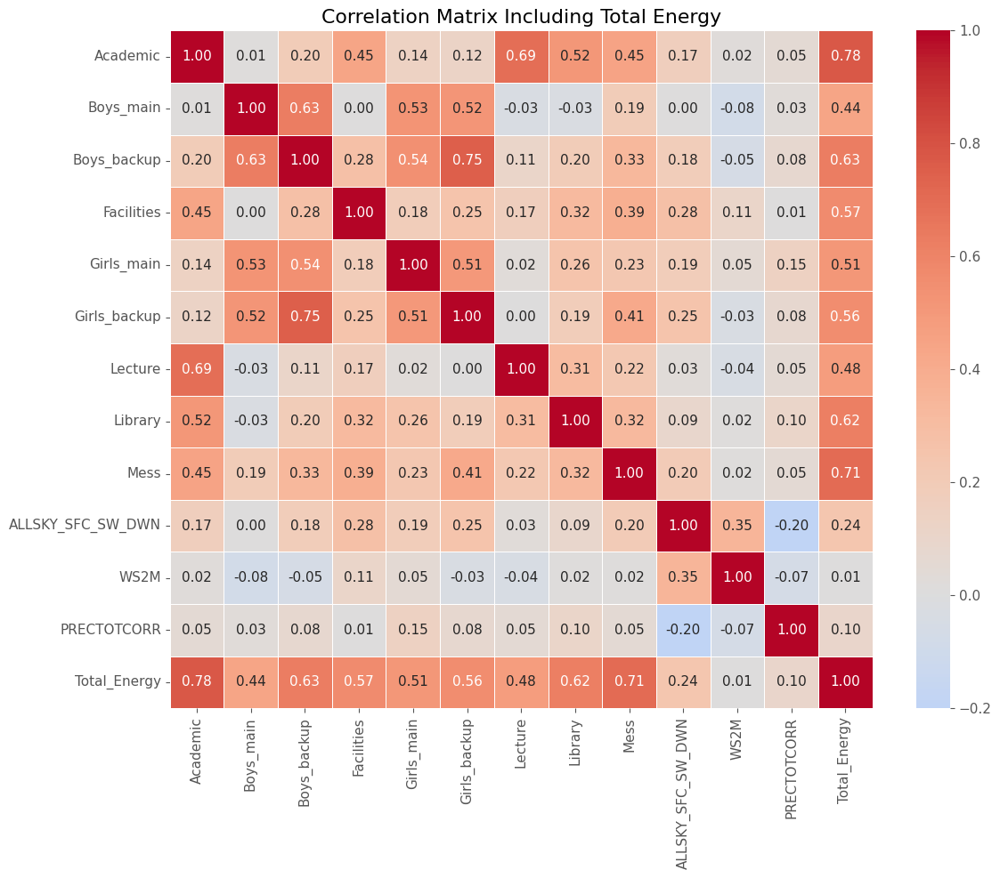

In [47]:
# =============================================================================
# CORRELATION WITH TOTAL ENERGY
# =============================================================================

correlation = (
    df.corr(numeric_only=True)["Total_Energy"]
      .sort_values(ascending=False)
)

correlation
# =============================================================================
# CORRELATION HEATMAP INCLUDING TOTAL ENERGY
# =============================================================================

heatmap_columns = building_cols + weather_cols + ["Total_Energy"]

correlation_matrix = df[heatmap_columns].corr()

plt.figure(figsize=(12,10))

sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)

plt.title("Correlation Matrix Including Total Energy")

plt.tight_layout()

plt.show()

In [49]:
# =============================================================================
# CREATE WEEKDAY INFORMATION
# =============================================================================

df["day_name"] = df["datetime"].dt.day_name()

df["day_type"] = np.where(
    df["datetime"].dt.weekday >= 5,
    "Weekend",
    "Weekday"
)
# =============================================================================
# AVERAGE TOTAL ENERGY BY DAY OF WEEK
# =============================================================================

day_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday"
]

daily_summary = (
    df.groupby("day_name")["Total_Energy"]
      .mean()
      .reindex(day_order)
      .reset_index()
)

print(daily_summary)

    day_name   Total_Energy
0     Monday  121196.154287
1    Tuesday  122357.662708
2  Wednesday  122432.556010
3   Thursday  121626.262988
4     Friday  119795.632612
5   Saturday  106475.488479
6     Sunday   99131.353048


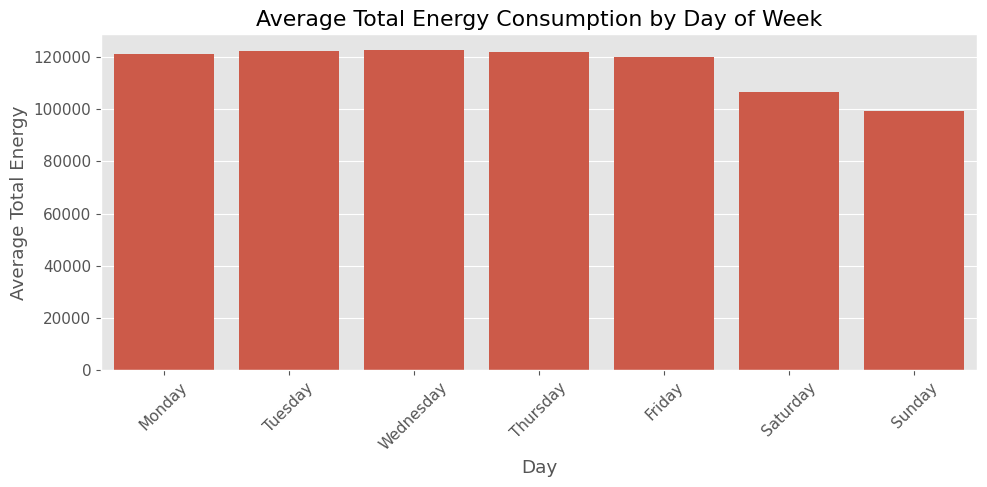

In [50]:
# =============================================================================
# TOTAL ENERGY BY DAY OF WEEK
# =============================================================================

plt.figure(figsize=(10,5))

sns.barplot(
    data=daily_summary,
    x="day_name",
    y="Total_Energy"
)

plt.title("Average Total Energy Consumption by Day of Week")

plt.xlabel("Day")

plt.ylabel("Average Total Energy")

plt.xticks(rotation=45)

plt.tight_layout()

plt.show()

  day_type   Total_Energy
0  Weekday  121481.947641
1  Weekend  102803.370821


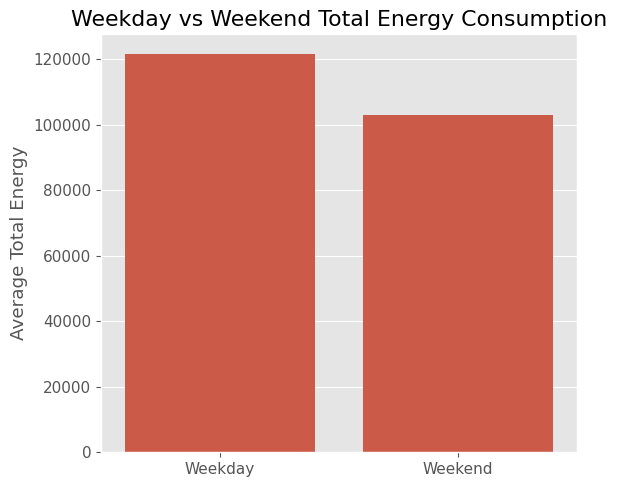

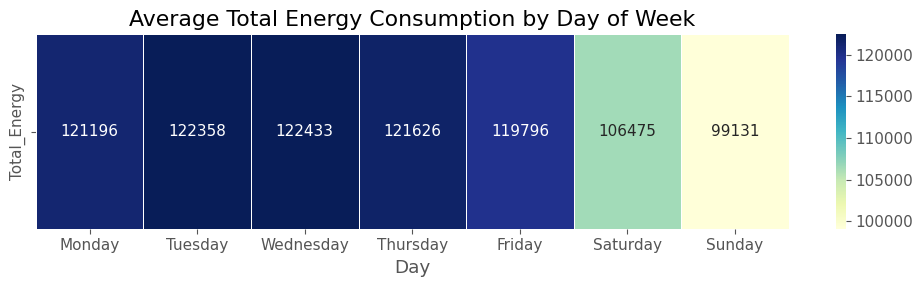

In [51]:
# =============================================================================
# WEEKDAY VS WEEKEND
# =============================================================================

weekday_summary = (
    df.groupby("day_type")["Total_Energy"]
      .mean()
      .reset_index()
)

print(weekday_summary)
# =============================================================================
# WEEKDAY VS WEEKEND ENERGY
# =============================================================================

plt.figure(figsize=(6,5))

sns.barplot(
    data=weekday_summary,
    x="day_type",
    y="Total_Energy"
)

plt.title("Weekday vs Weekend Total Energy Consumption")

plt.xlabel("")

plt.ylabel("Average Total Energy")

plt.tight_layout()

plt.show()
# =============================================================================
# WEEKDAY HEATMAP
# =============================================================================

weekday_heatmap = (
    df.groupby("day_name")[["Total_Energy"]]
      .mean()
      .reindex(day_order)
      .T
)

plt.figure(figsize=(10,3))

sns.heatmap(
    weekday_heatmap,
    annot=True,
    fmt=".0f",
    cmap="YlGnBu",
    linewidths=0.5
)

plt.title("Average Total Energy Consumption by Day of Week")

plt.xlabel("Day")

plt.ylabel("")

plt.tight_layout()

plt.show()